# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

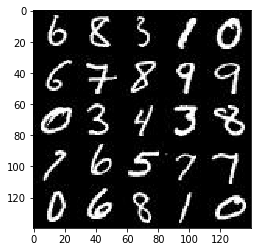

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

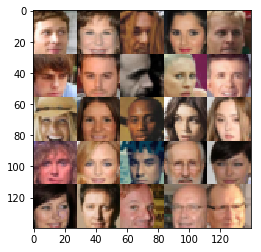

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, shape =(None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, shape=(None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, shape=(), name='learning_rate')
    
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        x1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope('generator', reuse= not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 2x2x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14x14x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #saver = tf.train.Saver()
    steps = 0
    show_every = 100
    print_every = 10
    
    inputs_real, inputs_z, learn_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images*2 # Need to remove -1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, learn_rate: learning_rate })
                _ = sess.run(g_train_opt, feed_dict={inputs_z: batch_z, inputs_real: batch_images, learn_rate: learning_rate})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = sess.run(d_loss, {inputs_z: batch_z, inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
        
                if steps % show_every == 0:
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)
        #saver.save(sess, './checkpoints/generator.ckpt')
        

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/5... Discriminator Loss: 1.2008... Generator Loss: 0.5661
Epoch 1/5... Discriminator Loss: 0.1547... Generator Loss: 2.9415
Epoch 1/5... Discriminator Loss: 0.2444... Generator Loss: 3.0536
Epoch 1/5... Discriminator Loss: 0.2676... Generator Loss: 1.9311
Epoch 1/5... Discriminator Loss: 0.2315... Generator Loss: 1.8198
Epoch 1/5... Discriminator Loss: 0.3962... Generator Loss: 9.1838
Epoch 1/5... Discriminator Loss: 0.2072... Generator Loss: 4.4610
Epoch 1/5... Discriminator Loss: 0.1035... Generator Loss: 3.6386
Epoch 1/5... Discriminator Loss: 0.3785... Generator Loss: 6.9365
Epoch 1/5... Discriminator Loss: 0.4574... Generator Loss: 1.9202


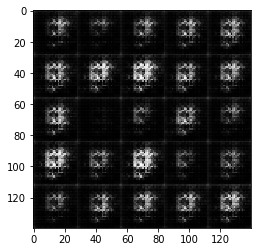

Epoch 1/5... Discriminator Loss: 0.3248... Generator Loss: 2.1687
Epoch 1/5... Discriminator Loss: 0.2010... Generator Loss: 2.5588
Epoch 1/5... Discriminator Loss: 0.2029... Generator Loss: 2.6346
Epoch 1/5... Discriminator Loss: 0.2839... Generator Loss: 2.7223
Epoch 1/5... Discriminator Loss: 0.3809... Generator Loss: 1.6554
Epoch 1/5... Discriminator Loss: 0.1173... Generator Loss: 3.0096
Epoch 1/5... Discriminator Loss: 0.0964... Generator Loss: 3.5564
Epoch 1/5... Discriminator Loss: 0.2150... Generator Loss: 4.4521
Epoch 1/5... Discriminator Loss: 0.1803... Generator Loss: 3.3695
Epoch 1/5... Discriminator Loss: 0.1264... Generator Loss: 3.0472


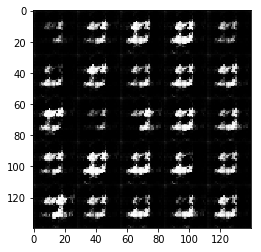

Epoch 1/5... Discriminator Loss: 0.1536... Generator Loss: 3.2068
Epoch 1/5... Discriminator Loss: 0.1273... Generator Loss: 3.8780
Epoch 1/5... Discriminator Loss: 0.0896... Generator Loss: 3.8497
Epoch 1/5... Discriminator Loss: 0.0850... Generator Loss: 3.6332
Epoch 1/5... Discriminator Loss: 0.0899... Generator Loss: 3.4063
Epoch 1/5... Discriminator Loss: 0.2012... Generator Loss: 4.0681
Epoch 1/5... Discriminator Loss: 0.1636... Generator Loss: 2.9575
Epoch 1/5... Discriminator Loss: 0.1158... Generator Loss: 5.2633
Epoch 1/5... Discriminator Loss: 0.1917... Generator Loss: 2.8783
Epoch 1/5... Discriminator Loss: 0.1766... Generator Loss: 3.0960


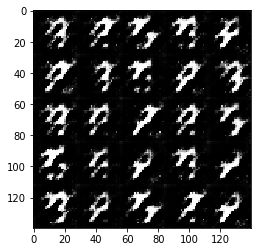

Epoch 1/5... Discriminator Loss: 0.1772... Generator Loss: 2.3552
Epoch 1/5... Discriminator Loss: 0.0963... Generator Loss: 3.6874
Epoch 1/5... Discriminator Loss: 0.0717... Generator Loss: 3.4159
Epoch 1/5... Discriminator Loss: 0.2133... Generator Loss: 2.3811
Epoch 1/5... Discriminator Loss: 0.1683... Generator Loss: 2.6536
Epoch 1/5... Discriminator Loss: 0.1840... Generator Loss: 2.9228
Epoch 1/5... Discriminator Loss: 0.1891... Generator Loss: 2.4837
Epoch 1/5... Discriminator Loss: 0.0951... Generator Loss: 3.1770
Epoch 1/5... Discriminator Loss: 0.1852... Generator Loss: 2.6102
Epoch 1/5... Discriminator Loss: 0.1669... Generator Loss: 2.8296


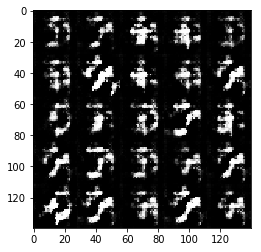

Epoch 1/5... Discriminator Loss: 0.5002... Generator Loss: 1.1280
Epoch 1/5... Discriminator Loss: 0.1952... Generator Loss: 2.6853
Epoch 1/5... Discriminator Loss: 0.3893... Generator Loss: 1.5889
Epoch 1/5... Discriminator Loss: 0.4222... Generator Loss: 5.2661
Epoch 1/5... Discriminator Loss: 0.2322... Generator Loss: 2.4569
Epoch 1/5... Discriminator Loss: 0.1632... Generator Loss: 2.9169
Epoch 1/5... Discriminator Loss: 0.1541... Generator Loss: 2.8773
Epoch 1/5... Discriminator Loss: 0.1180... Generator Loss: 3.3945
Epoch 1/5... Discriminator Loss: 0.2541... Generator Loss: 2.6267
Epoch 1/5... Discriminator Loss: 0.8224... Generator Loss: 5.3347


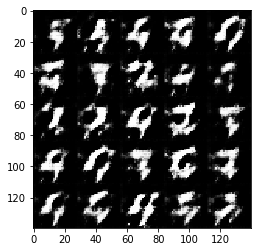

Epoch 1/5... Discriminator Loss: 0.3490... Generator Loss: 2.1319
Epoch 1/5... Discriminator Loss: 0.1687... Generator Loss: 2.9496
Epoch 1/5... Discriminator Loss: 0.4937... Generator Loss: 3.7874
Epoch 1/5... Discriminator Loss: 0.5698... Generator Loss: 4.2790
Epoch 1/5... Discriminator Loss: 0.4623... Generator Loss: 1.7606
Epoch 1/5... Discriminator Loss: 0.5253... Generator Loss: 1.7803
Epoch 1/5... Discriminator Loss: 1.2778... Generator Loss: 4.8172
Epoch 1/5... Discriminator Loss: 0.4778... Generator Loss: 2.5567
Epoch 1/5... Discriminator Loss: 0.9520... Generator Loss: 0.7599
Epoch 1/5... Discriminator Loss: 0.3611... Generator Loss: 2.4904


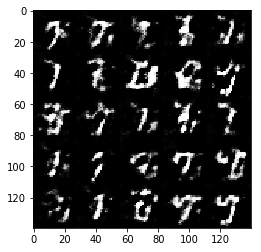

Epoch 1/5... Discriminator Loss: 0.7019... Generator Loss: 1.1951
Epoch 1/5... Discriminator Loss: 0.8108... Generator Loss: 4.8447
Epoch 1/5... Discriminator Loss: 0.4593... Generator Loss: 2.9016
Epoch 1/5... Discriminator Loss: 0.3448... Generator Loss: 1.9350
Epoch 1/5... Discriminator Loss: 0.4984... Generator Loss: 2.0713
Epoch 1/5... Discriminator Loss: 0.3907... Generator Loss: 1.8542
Epoch 1/5... Discriminator Loss: 0.9146... Generator Loss: 0.8722
Epoch 1/5... Discriminator Loss: 0.4439... Generator Loss: 1.6763
Epoch 1/5... Discriminator Loss: 0.2991... Generator Loss: 2.6594
Epoch 1/5... Discriminator Loss: 0.4325... Generator Loss: 2.5943


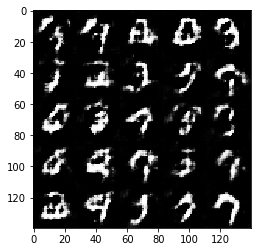

Epoch 1/5... Discriminator Loss: 0.5753... Generator Loss: 1.7151
Epoch 1/5... Discriminator Loss: 0.3780... Generator Loss: 2.1866
Epoch 1/5... Discriminator Loss: 0.6006... Generator Loss: 1.6729
Epoch 1/5... Discriminator Loss: 0.7395... Generator Loss: 1.2831
Epoch 1/5... Discriminator Loss: 0.3745... Generator Loss: 2.9367
Epoch 1/5... Discriminator Loss: 0.5518... Generator Loss: 1.8311
Epoch 1/5... Discriminator Loss: 0.4559... Generator Loss: 1.6728
Epoch 1/5... Discriminator Loss: 0.7675... Generator Loss: 1.1504
Epoch 1/5... Discriminator Loss: 0.6288... Generator Loss: 2.4294
Epoch 1/5... Discriminator Loss: 0.5135... Generator Loss: 2.1234


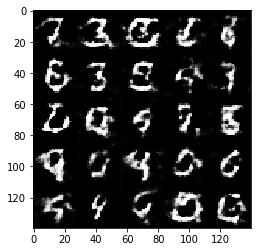

Epoch 1/5... Discriminator Loss: 0.5987... Generator Loss: 1.6397
Epoch 1/5... Discriminator Loss: 0.6878... Generator Loss: 1.3890
Epoch 1/5... Discriminator Loss: 0.6076... Generator Loss: 1.3293
Epoch 1/5... Discriminator Loss: 0.7343... Generator Loss: 1.1148
Epoch 1/5... Discriminator Loss: 0.9285... Generator Loss: 0.8232
Epoch 1/5... Discriminator Loss: 0.6433... Generator Loss: 3.1506
Epoch 1/5... Discriminator Loss: 0.5313... Generator Loss: 2.7580
Epoch 1/5... Discriminator Loss: 0.5384... Generator Loss: 1.7549
Epoch 1/5... Discriminator Loss: 0.6693... Generator Loss: 1.1959
Epoch 1/5... Discriminator Loss: 0.6502... Generator Loss: 2.0085


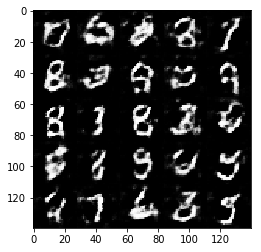

Epoch 1/5... Discriminator Loss: 0.6952... Generator Loss: 1.7391
Epoch 1/5... Discriminator Loss: 1.2447... Generator Loss: 0.5463
Epoch 1/5... Discriminator Loss: 0.5664... Generator Loss: 2.5471
Epoch 2/5... Discriminator Loss: 0.5232... Generator Loss: 2.7320
Epoch 2/5... Discriminator Loss: 0.7938... Generator Loss: 1.3610
Epoch 2/5... Discriminator Loss: 1.0680... Generator Loss: 3.2648
Epoch 2/5... Discriminator Loss: 1.0064... Generator Loss: 0.7764
Epoch 2/5... Discriminator Loss: 1.0324... Generator Loss: 0.7558
Epoch 2/5... Discriminator Loss: 0.5415... Generator Loss: 2.1238
Epoch 2/5... Discriminator Loss: 0.9774... Generator Loss: 0.8210


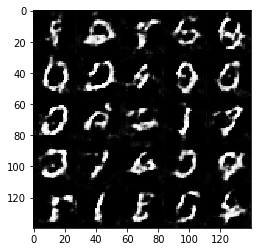

Epoch 2/5... Discriminator Loss: 0.7695... Generator Loss: 0.9159
Epoch 2/5... Discriminator Loss: 0.6065... Generator Loss: 2.0679
Epoch 2/5... Discriminator Loss: 0.5439... Generator Loss: 2.3667
Epoch 2/5... Discriminator Loss: 0.6331... Generator Loss: 2.0406
Epoch 2/5... Discriminator Loss: 0.6000... Generator Loss: 2.0943
Epoch 2/5... Discriminator Loss: 0.4687... Generator Loss: 1.9750
Epoch 2/5... Discriminator Loss: 0.5106... Generator Loss: 2.1096
Epoch 2/5... Discriminator Loss: 0.5424... Generator Loss: 2.3339
Epoch 2/5... Discriminator Loss: 0.6491... Generator Loss: 1.8020
Epoch 2/5... Discriminator Loss: 0.8202... Generator Loss: 0.9559


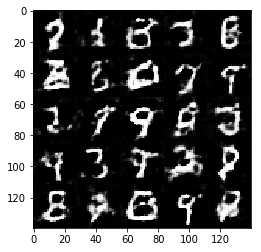

Epoch 2/5... Discriminator Loss: 0.6991... Generator Loss: 1.2639
Epoch 2/5... Discriminator Loss: 0.8407... Generator Loss: 0.8888
Epoch 2/5... Discriminator Loss: 0.7461... Generator Loss: 1.4031
Epoch 2/5... Discriminator Loss: 0.8217... Generator Loss: 2.2719
Epoch 2/5... Discriminator Loss: 0.6868... Generator Loss: 1.0868
Epoch 2/5... Discriminator Loss: 0.7666... Generator Loss: 2.2079
Epoch 2/5... Discriminator Loss: 0.6123... Generator Loss: 1.2371
Epoch 2/5... Discriminator Loss: 0.7362... Generator Loss: 0.9611
Epoch 2/5... Discriminator Loss: 0.8222... Generator Loss: 0.7794
Epoch 2/5... Discriminator Loss: 0.7865... Generator Loss: 0.8705


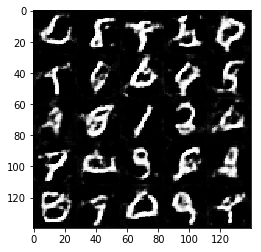

Epoch 2/5... Discriminator Loss: 0.8481... Generator Loss: 2.0363
Epoch 2/5... Discriminator Loss: 1.5996... Generator Loss: 0.3289
Epoch 2/5... Discriminator Loss: 0.6855... Generator Loss: 1.2769
Epoch 2/5... Discriminator Loss: 0.7264... Generator Loss: 1.3372
Epoch 2/5... Discriminator Loss: 0.6718... Generator Loss: 2.3473
Epoch 2/5... Discriminator Loss: 0.6280... Generator Loss: 1.5537
Epoch 2/5... Discriminator Loss: 0.5728... Generator Loss: 1.7805
Epoch 2/5... Discriminator Loss: 1.2653... Generator Loss: 0.4590
Epoch 2/5... Discriminator Loss: 0.6877... Generator Loss: 1.3561
Epoch 2/5... Discriminator Loss: 0.6403... Generator Loss: 1.7628


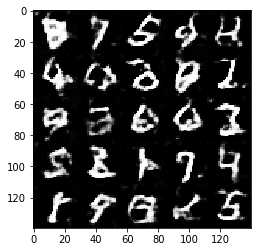

Epoch 2/5... Discriminator Loss: 1.3483... Generator Loss: 0.3781
Epoch 2/5... Discriminator Loss: 0.8458... Generator Loss: 0.8530
Epoch 2/5... Discriminator Loss: 0.6175... Generator Loss: 1.3795
Epoch 2/5... Discriminator Loss: 0.5890... Generator Loss: 1.4493
Epoch 2/5... Discriminator Loss: 0.6353... Generator Loss: 1.6022
Epoch 2/5... Discriminator Loss: 0.7308... Generator Loss: 0.9805
Epoch 2/5... Discriminator Loss: 0.5560... Generator Loss: 1.4568
Epoch 2/5... Discriminator Loss: 1.3464... Generator Loss: 0.4153
Epoch 2/5... Discriminator Loss: 0.9635... Generator Loss: 0.6626
Epoch 2/5... Discriminator Loss: 0.6434... Generator Loss: 1.9350


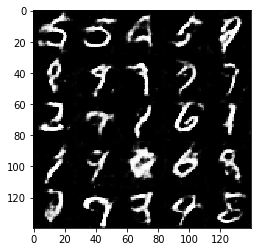

Epoch 2/5... Discriminator Loss: 0.8129... Generator Loss: 0.9984
Epoch 2/5... Discriminator Loss: 0.6253... Generator Loss: 1.4772
Epoch 2/5... Discriminator Loss: 0.6744... Generator Loss: 1.9852
Epoch 2/5... Discriminator Loss: 1.8502... Generator Loss: 0.2641
Epoch 2/5... Discriminator Loss: 0.8647... Generator Loss: 0.8577
Epoch 2/5... Discriminator Loss: 0.4648... Generator Loss: 1.7878
Epoch 2/5... Discriminator Loss: 0.5890... Generator Loss: 1.1492
Epoch 2/5... Discriminator Loss: 0.5902... Generator Loss: 1.6839
Epoch 2/5... Discriminator Loss: 0.6583... Generator Loss: 1.6461
Epoch 2/5... Discriminator Loss: 0.8365... Generator Loss: 0.7806


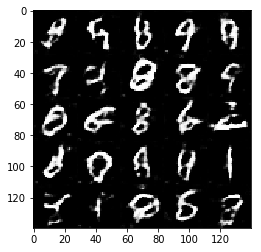

Epoch 2/5... Discriminator Loss: 0.7383... Generator Loss: 2.1158
Epoch 2/5... Discriminator Loss: 0.5497... Generator Loss: 1.9150
Epoch 2/5... Discriminator Loss: 0.6726... Generator Loss: 0.9650
Epoch 2/5... Discriminator Loss: 0.7743... Generator Loss: 0.8048
Epoch 2/5... Discriminator Loss: 4.7820... Generator Loss: 5.7063
Epoch 2/5... Discriminator Loss: 0.5451... Generator Loss: 1.3244
Epoch 2/5... Discriminator Loss: 0.5694... Generator Loss: 1.3208
Epoch 2/5... Discriminator Loss: 1.0349... Generator Loss: 0.6032
Epoch 2/5... Discriminator Loss: 0.5625... Generator Loss: 1.3479
Epoch 2/5... Discriminator Loss: 0.6532... Generator Loss: 1.0836


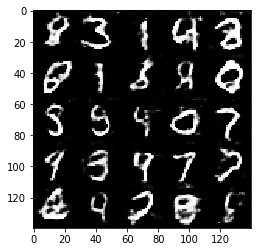

Epoch 2/5... Discriminator Loss: 0.6708... Generator Loss: 2.7225
Epoch 2/5... Discriminator Loss: 0.7168... Generator Loss: 0.8996
Epoch 2/5... Discriminator Loss: 0.6592... Generator Loss: 1.0263
Epoch 2/5... Discriminator Loss: 0.5706... Generator Loss: 1.6857
Epoch 2/5... Discriminator Loss: 0.5929... Generator Loss: 1.1102
Epoch 2/5... Discriminator Loss: 0.4097... Generator Loss: 2.1107
Epoch 2/5... Discriminator Loss: 1.1744... Generator Loss: 0.8295
Epoch 2/5... Discriminator Loss: 1.3655... Generator Loss: 0.3976
Epoch 2/5... Discriminator Loss: 0.7081... Generator Loss: 1.1703
Epoch 2/5... Discriminator Loss: 0.6606... Generator Loss: 1.3768


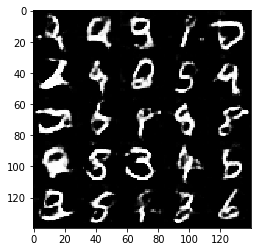

Epoch 2/5... Discriminator Loss: 0.6034... Generator Loss: 1.0853
Epoch 2/5... Discriminator Loss: 0.5563... Generator Loss: 1.2840
Epoch 2/5... Discriminator Loss: 0.5655... Generator Loss: 1.1685
Epoch 2/5... Discriminator Loss: 0.6440... Generator Loss: 1.0097
Epoch 2/5... Discriminator Loss: 0.5035... Generator Loss: 1.3468
Epoch 2/5... Discriminator Loss: 0.5052... Generator Loss: 1.4368
Epoch 2/5... Discriminator Loss: 0.9290... Generator Loss: 2.5119
Epoch 2/5... Discriminator Loss: 0.6986... Generator Loss: 1.7963
Epoch 2/5... Discriminator Loss: 0.5575... Generator Loss: 1.2793
Epoch 2/5... Discriminator Loss: 0.5398... Generator Loss: 1.7321


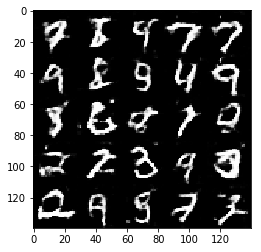

Epoch 2/5... Discriminator Loss: 0.5391... Generator Loss: 1.4650
Epoch 2/5... Discriminator Loss: 0.4402... Generator Loss: 1.5206
Epoch 2/5... Discriminator Loss: 0.5777... Generator Loss: 1.2459
Epoch 2/5... Discriminator Loss: 0.5568... Generator Loss: 1.3782
Epoch 2/5... Discriminator Loss: 1.1563... Generator Loss: 0.5996
Epoch 2/5... Discriminator Loss: 0.6846... Generator Loss: 1.0608
Epoch 2/5... Discriminator Loss: 0.6225... Generator Loss: 1.0911
Epoch 3/5... Discriminator Loss: 0.6421... Generator Loss: 1.1795
Epoch 3/5... Discriminator Loss: 0.8143... Generator Loss: 0.7825
Epoch 3/5... Discriminator Loss: 0.5678... Generator Loss: 1.1545


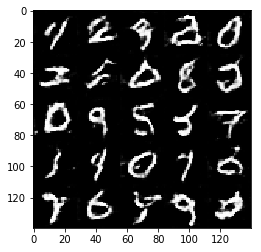

Epoch 3/5... Discriminator Loss: 0.6020... Generator Loss: 1.0533
Epoch 3/5... Discriminator Loss: 0.8274... Generator Loss: 0.7611
Epoch 3/5... Discriminator Loss: 0.8574... Generator Loss: 2.0162
Epoch 3/5... Discriminator Loss: 0.9842... Generator Loss: 0.6335
Epoch 3/5... Discriminator Loss: 0.6633... Generator Loss: 1.2536
Epoch 3/5... Discriminator Loss: 0.4761... Generator Loss: 1.4476
Epoch 3/5... Discriminator Loss: 0.5580... Generator Loss: 1.1167
Epoch 3/5... Discriminator Loss: 1.7786... Generator Loss: 3.1814
Epoch 3/5... Discriminator Loss: 0.7627... Generator Loss: 0.9329
Epoch 3/5... Discriminator Loss: 0.6356... Generator Loss: 1.0393


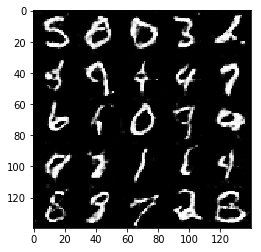

Epoch 3/5... Discriminator Loss: 0.4896... Generator Loss: 1.6360
Epoch 3/5... Discriminator Loss: 0.9917... Generator Loss: 0.6456
Epoch 3/5... Discriminator Loss: 0.4504... Generator Loss: 1.6365
Epoch 3/5... Discriminator Loss: 5.3906... Generator Loss: 0.0113
Epoch 3/5... Discriminator Loss: 0.6423... Generator Loss: 1.1628
Epoch 3/5... Discriminator Loss: 0.6916... Generator Loss: 1.1199
Epoch 3/5... Discriminator Loss: 0.8074... Generator Loss: 0.8072
Epoch 3/5... Discriminator Loss: 0.6131... Generator Loss: 1.0942
Epoch 3/5... Discriminator Loss: 0.4889... Generator Loss: 1.3269
Epoch 3/5... Discriminator Loss: 0.6444... Generator Loss: 1.0519


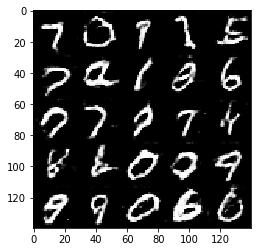

Epoch 3/5... Discriminator Loss: 0.5880... Generator Loss: 1.2521
Epoch 3/5... Discriminator Loss: 0.5680... Generator Loss: 1.2200
Epoch 3/5... Discriminator Loss: 0.6319... Generator Loss: 1.4363
Epoch 3/5... Discriminator Loss: 0.6877... Generator Loss: 1.0034
Epoch 3/5... Discriminator Loss: 0.8754... Generator Loss: 0.7948
Epoch 3/5... Discriminator Loss: 0.9125... Generator Loss: 0.7053
Epoch 3/5... Discriminator Loss: 0.5941... Generator Loss: 1.1333
Epoch 3/5... Discriminator Loss: 0.5430... Generator Loss: 1.8088
Epoch 3/5... Discriminator Loss: 0.6976... Generator Loss: 1.1278
Epoch 3/5... Discriminator Loss: 0.6972... Generator Loss: 0.8820


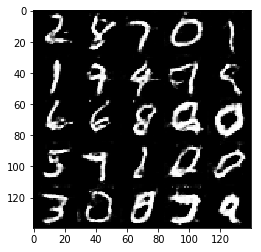

Epoch 3/5... Discriminator Loss: 0.7051... Generator Loss: 1.4412
Epoch 3/5... Discriminator Loss: 0.7797... Generator Loss: 0.8229
Epoch 3/5... Discriminator Loss: 0.4759... Generator Loss: 1.7503
Epoch 3/5... Discriminator Loss: 0.9281... Generator Loss: 2.4600
Epoch 3/5... Discriminator Loss: 0.8004... Generator Loss: 0.8755
Epoch 3/5... Discriminator Loss: 1.0745... Generator Loss: 2.8631
Epoch 3/5... Discriminator Loss: 0.5517... Generator Loss: 1.2683
Epoch 3/5... Discriminator Loss: 0.6454... Generator Loss: 1.0416
Epoch 3/5... Discriminator Loss: 0.5071... Generator Loss: 1.5883
Epoch 3/5... Discriminator Loss: 0.9437... Generator Loss: 0.6277


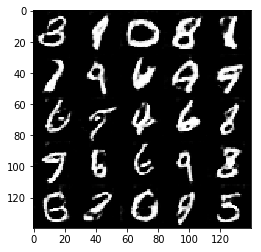

Epoch 3/5... Discriminator Loss: 0.6456... Generator Loss: 1.0458
Epoch 3/5... Discriminator Loss: 0.5003... Generator Loss: 1.3405
Epoch 3/5... Discriminator Loss: 0.9025... Generator Loss: 0.7121
Epoch 3/5... Discriminator Loss: 0.5692... Generator Loss: 1.7434
Epoch 3/5... Discriminator Loss: 0.7863... Generator Loss: 3.0019
Epoch 3/5... Discriminator Loss: 0.8245... Generator Loss: 0.8675
Epoch 3/5... Discriminator Loss: 0.5808... Generator Loss: 1.3906
Epoch 3/5... Discriminator Loss: 0.8828... Generator Loss: 0.6824
Epoch 3/5... Discriminator Loss: 0.7250... Generator Loss: 0.9047
Epoch 3/5... Discriminator Loss: 0.4135... Generator Loss: 1.6465


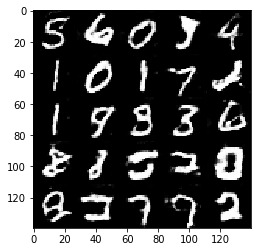

Epoch 3/5... Discriminator Loss: 0.5851... Generator Loss: 1.1539
Epoch 3/5... Discriminator Loss: 0.9019... Generator Loss: 0.7440
Epoch 3/5... Discriminator Loss: 1.7693... Generator Loss: 3.1870
Epoch 3/5... Discriminator Loss: 0.8884... Generator Loss: 2.8281
Epoch 3/5... Discriminator Loss: 0.6710... Generator Loss: 2.0701
Epoch 3/5... Discriminator Loss: 0.5809... Generator Loss: 1.3573
Epoch 3/5... Discriminator Loss: 0.8052... Generator Loss: 0.8546
Epoch 3/5... Discriminator Loss: 1.1127... Generator Loss: 0.5788
Epoch 3/5... Discriminator Loss: 0.5144... Generator Loss: 1.4054
Epoch 3/5... Discriminator Loss: 0.9801... Generator Loss: 0.7150


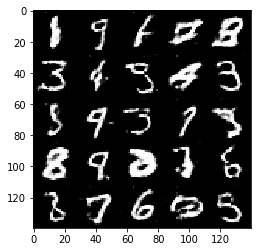

Epoch 3/5... Discriminator Loss: 1.2224... Generator Loss: 2.8536
Epoch 3/5... Discriminator Loss: 0.5486... Generator Loss: 1.2950
Epoch 3/5... Discriminator Loss: 0.6470... Generator Loss: 1.0687
Epoch 3/5... Discriminator Loss: 0.4183... Generator Loss: 1.5082
Epoch 3/5... Discriminator Loss: 0.8888... Generator Loss: 0.7134
Epoch 3/5... Discriminator Loss: 2.7864... Generator Loss: 5.7730
Epoch 3/5... Discriminator Loss: 0.6999... Generator Loss: 1.8012
Epoch 3/5... Discriminator Loss: 0.8555... Generator Loss: 0.8595
Epoch 3/5... Discriminator Loss: 0.4902... Generator Loss: 1.7857
Epoch 3/5... Discriminator Loss: 0.6164... Generator Loss: 1.1947


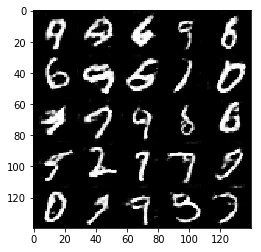

Epoch 3/5... Discriminator Loss: 0.5379... Generator Loss: 1.3479
Epoch 3/5... Discriminator Loss: 0.6840... Generator Loss: 1.0880
Epoch 3/5... Discriminator Loss: 0.8329... Generator Loss: 0.8147
Epoch 3/5... Discriminator Loss: 0.4732... Generator Loss: 1.6365
Epoch 3/5... Discriminator Loss: 0.6373... Generator Loss: 0.9964
Epoch 3/5... Discriminator Loss: 0.5671... Generator Loss: 1.2531
Epoch 3/5... Discriminator Loss: 0.4644... Generator Loss: 1.7537
Epoch 3/5... Discriminator Loss: 1.0181... Generator Loss: 4.0271
Epoch 3/5... Discriminator Loss: 0.9573... Generator Loss: 0.7064
Epoch 3/5... Discriminator Loss: 0.5320... Generator Loss: 1.5415


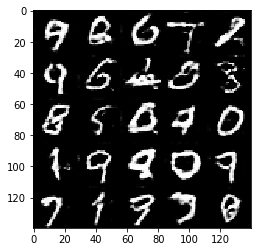

Epoch 3/5... Discriminator Loss: 0.3535... Generator Loss: 2.0306
Epoch 3/5... Discriminator Loss: 0.4523... Generator Loss: 1.4707
Epoch 3/5... Discriminator Loss: 0.5417... Generator Loss: 1.3599
Epoch 3/5... Discriminator Loss: 1.4916... Generator Loss: 0.4433
Epoch 3/5... Discriminator Loss: 0.5756... Generator Loss: 1.5159
Epoch 3/5... Discriminator Loss: 0.7213... Generator Loss: 0.8405
Epoch 3/5... Discriminator Loss: 0.9896... Generator Loss: 3.1114
Epoch 3/5... Discriminator Loss: 0.7231... Generator Loss: 1.1872
Epoch 3/5... Discriminator Loss: 0.5929... Generator Loss: 1.2573
Epoch 3/5... Discriminator Loss: 0.6258... Generator Loss: 1.1208


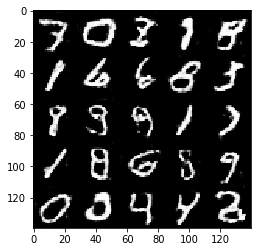

Epoch 3/5... Discriminator Loss: 0.7181... Generator Loss: 0.9799
Epoch 4/5... Discriminator Loss: 0.6810... Generator Loss: 0.9561
Epoch 4/5... Discriminator Loss: 0.7450... Generator Loss: 0.9202
Epoch 4/5... Discriminator Loss: 0.5665... Generator Loss: 1.8514
Epoch 4/5... Discriminator Loss: 0.6508... Generator Loss: 0.9873
Epoch 4/5... Discriminator Loss: 0.7609... Generator Loss: 0.8340
Epoch 4/5... Discriminator Loss: 0.7192... Generator Loss: 2.1330
Epoch 4/5... Discriminator Loss: 0.9780... Generator Loss: 0.6810
Epoch 4/5... Discriminator Loss: 0.4013... Generator Loss: 2.0157
Epoch 4/5... Discriminator Loss: 1.3031... Generator Loss: 0.5037


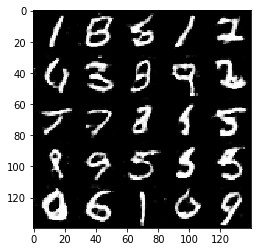

Epoch 4/5... Discriminator Loss: 0.7996... Generator Loss: 0.8584
Epoch 4/5... Discriminator Loss: 0.5261... Generator Loss: 1.2477
Epoch 4/5... Discriminator Loss: 0.6253... Generator Loss: 1.0983
Epoch 4/5... Discriminator Loss: 0.4845... Generator Loss: 1.4742
Epoch 4/5... Discriminator Loss: 0.5495... Generator Loss: 1.4289
Epoch 4/5... Discriminator Loss: 0.5109... Generator Loss: 1.2540
Epoch 4/5... Discriminator Loss: 0.7397... Generator Loss: 0.8446
Epoch 4/5... Discriminator Loss: 1.5851... Generator Loss: 0.3356
Epoch 4/5... Discriminator Loss: 0.5464... Generator Loss: 1.9511
Epoch 4/5... Discriminator Loss: 0.6574... Generator Loss: 1.0025


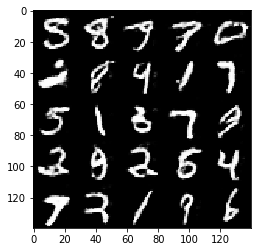

Epoch 4/5... Discriminator Loss: 0.4472... Generator Loss: 1.7606
Epoch 4/5... Discriminator Loss: 0.8601... Generator Loss: 2.9561
Epoch 4/5... Discriminator Loss: 0.5681... Generator Loss: 2.6445
Epoch 4/5... Discriminator Loss: 0.9788... Generator Loss: 0.8030
Epoch 4/5... Discriminator Loss: 0.6959... Generator Loss: 0.9613
Epoch 4/5... Discriminator Loss: 1.1434... Generator Loss: 0.5950
Epoch 4/5... Discriminator Loss: 0.5538... Generator Loss: 1.1527
Epoch 4/5... Discriminator Loss: 0.3988... Generator Loss: 1.5002
Epoch 4/5... Discriminator Loss: 0.8825... Generator Loss: 0.7419
Epoch 4/5... Discriminator Loss: 0.7495... Generator Loss: 0.9052


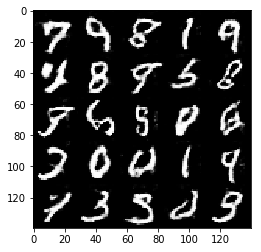

Epoch 4/5... Discriminator Loss: 1.0585... Generator Loss: 0.6124
Epoch 4/5... Discriminator Loss: 0.6627... Generator Loss: 0.9836
Epoch 4/5... Discriminator Loss: 0.7188... Generator Loss: 0.9455
Epoch 4/5... Discriminator Loss: 0.3733... Generator Loss: 2.1846
Epoch 4/5... Discriminator Loss: 0.5535... Generator Loss: 1.1364
Epoch 4/5... Discriminator Loss: 0.5028... Generator Loss: 2.2339
Epoch 4/5... Discriminator Loss: 1.1703... Generator Loss: 3.0237
Epoch 4/5... Discriminator Loss: 0.7772... Generator Loss: 0.9616
Epoch 4/5... Discriminator Loss: 0.9989... Generator Loss: 0.7152
Epoch 4/5... Discriminator Loss: 0.4814... Generator Loss: 1.4933


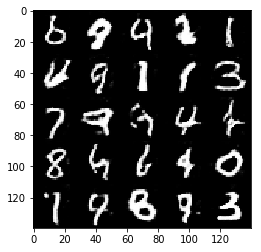

Epoch 4/5... Discriminator Loss: 0.4005... Generator Loss: 1.8167
Epoch 4/5... Discriminator Loss: 0.4466... Generator Loss: 1.8024
Epoch 4/5... Discriminator Loss: 0.6506... Generator Loss: 0.9954
Epoch 4/5... Discriminator Loss: 0.4880... Generator Loss: 1.3917
Epoch 4/5... Discriminator Loss: 0.4638... Generator Loss: 1.3474
Epoch 4/5... Discriminator Loss: 0.5359... Generator Loss: 1.1487
Epoch 4/5... Discriminator Loss: 0.5005... Generator Loss: 1.4111
Epoch 4/5... Discriminator Loss: 0.4614... Generator Loss: 1.3910
Epoch 4/5... Discriminator Loss: 0.3783... Generator Loss: 1.6180
Epoch 4/5... Discriminator Loss: 1.5129... Generator Loss: 0.4080


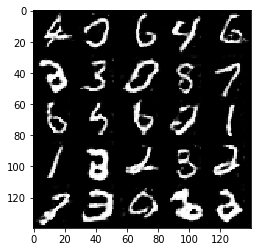

Epoch 4/5... Discriminator Loss: 0.5180... Generator Loss: 1.3750
Epoch 4/5... Discriminator Loss: 0.6805... Generator Loss: 1.9346
Epoch 4/5... Discriminator Loss: 0.7794... Generator Loss: 0.8336
Epoch 4/5... Discriminator Loss: 0.5041... Generator Loss: 1.3454
Epoch 4/5... Discriminator Loss: 0.6396... Generator Loss: 0.9910
Epoch 4/5... Discriminator Loss: 0.7011... Generator Loss: 0.9128
Epoch 4/5... Discriminator Loss: 0.4926... Generator Loss: 1.2553
Epoch 4/5... Discriminator Loss: 0.4599... Generator Loss: 1.8175
Epoch 4/5... Discriminator Loss: 0.5224... Generator Loss: 1.1589
Epoch 4/5... Discriminator Loss: 0.3234... Generator Loss: 2.2349


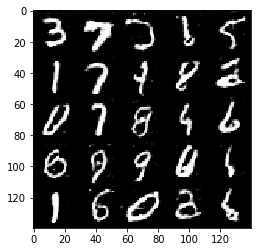

Epoch 4/5... Discriminator Loss: 0.5137... Generator Loss: 1.4241
Epoch 4/5... Discriminator Loss: 1.1533... Generator Loss: 3.5037
Epoch 4/5... Discriminator Loss: 0.6822... Generator Loss: 1.1604
Epoch 4/5... Discriminator Loss: 0.4951... Generator Loss: 1.4331
Epoch 4/5... Discriminator Loss: 0.5004... Generator Loss: 1.2213
Epoch 4/5... Discriminator Loss: 0.6622... Generator Loss: 0.9999
Epoch 4/5... Discriminator Loss: 0.3857... Generator Loss: 1.6589
Epoch 4/5... Discriminator Loss: 0.3885... Generator Loss: 1.7492
Epoch 4/5... Discriminator Loss: 0.2927... Generator Loss: 2.0786
Epoch 4/5... Discriminator Loss: 1.2327... Generator Loss: 3.7705


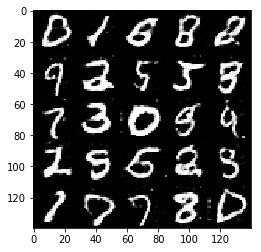

Epoch 4/5... Discriminator Loss: 0.5284... Generator Loss: 1.5958
Epoch 4/5... Discriminator Loss: 0.8610... Generator Loss: 0.8180
Epoch 4/5... Discriminator Loss: 0.5317... Generator Loss: 1.3176
Epoch 4/5... Discriminator Loss: 0.8232... Generator Loss: 0.8606
Epoch 4/5... Discriminator Loss: 0.5353... Generator Loss: 1.1935
Epoch 4/5... Discriminator Loss: 0.6965... Generator Loss: 0.9343
Epoch 4/5... Discriminator Loss: 0.6093... Generator Loss: 1.1327
Epoch 4/5... Discriminator Loss: 0.4108... Generator Loss: 2.1204
Epoch 4/5... Discriminator Loss: 0.7460... Generator Loss: 0.8858
Epoch 4/5... Discriminator Loss: 0.8281... Generator Loss: 0.7942


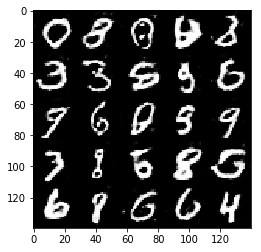

Epoch 4/5... Discriminator Loss: 0.4607... Generator Loss: 1.3047
Epoch 4/5... Discriminator Loss: 0.3118... Generator Loss: 2.0388
Epoch 4/5... Discriminator Loss: 0.6733... Generator Loss: 1.0417
Epoch 4/5... Discriminator Loss: 0.6699... Generator Loss: 1.0090
Epoch 4/5... Discriminator Loss: 0.4536... Generator Loss: 1.4262
Epoch 4/5... Discriminator Loss: 1.1049... Generator Loss: 0.5142
Epoch 4/5... Discriminator Loss: 0.6007... Generator Loss: 1.4175
Epoch 4/5... Discriminator Loss: 0.7974... Generator Loss: 1.1121
Epoch 4/5... Discriminator Loss: 0.4704... Generator Loss: 1.8197
Epoch 4/5... Discriminator Loss: 0.4135... Generator Loss: 1.4451


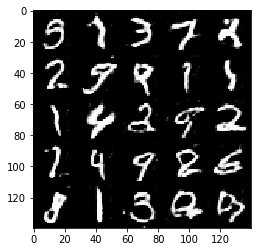

Epoch 4/5... Discriminator Loss: 0.5789... Generator Loss: 1.7084
Epoch 4/5... Discriminator Loss: 0.4712... Generator Loss: 1.5812
Epoch 4/5... Discriminator Loss: 0.4200... Generator Loss: 1.8766
Epoch 4/5... Discriminator Loss: 0.4943... Generator Loss: 1.2878
Epoch 5/5... Discriminator Loss: 0.6138... Generator Loss: 1.1272
Epoch 5/5... Discriminator Loss: 0.4345... Generator Loss: 1.8343
Epoch 5/5... Discriminator Loss: 0.4444... Generator Loss: 1.4380
Epoch 5/5... Discriminator Loss: 0.5984... Generator Loss: 1.1789
Epoch 5/5... Discriminator Loss: 0.5906... Generator Loss: 1.1695
Epoch 5/5... Discriminator Loss: 0.5355... Generator Loss: 1.2339


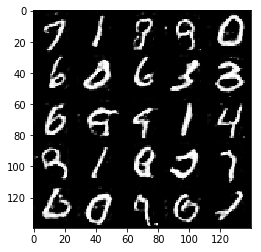

Epoch 5/5... Discriminator Loss: 0.4950... Generator Loss: 1.2362
Epoch 5/5... Discriminator Loss: 0.7810... Generator Loss: 0.8409
Epoch 5/5... Discriminator Loss: 0.4104... Generator Loss: 1.5836
Epoch 5/5... Discriminator Loss: 0.5741... Generator Loss: 1.0692
Epoch 5/5... Discriminator Loss: 0.7413... Generator Loss: 0.9906
Epoch 5/5... Discriminator Loss: 0.7899... Generator Loss: 0.7945
Epoch 5/5... Discriminator Loss: 3.5001... Generator Loss: 7.7597
Epoch 5/5... Discriminator Loss: 0.8472... Generator Loss: 0.8548
Epoch 5/5... Discriminator Loss: 0.6415... Generator Loss: 1.0937
Epoch 5/5... Discriminator Loss: 0.5685... Generator Loss: 2.0298


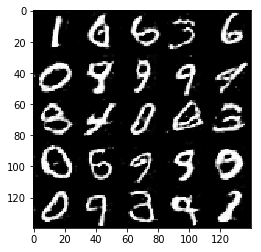

Epoch 5/5... Discriminator Loss: 0.6082... Generator Loss: 1.2339
Epoch 5/5... Discriminator Loss: 0.6961... Generator Loss: 0.9441
Epoch 5/5... Discriminator Loss: 0.4815... Generator Loss: 1.3096
Epoch 5/5... Discriminator Loss: 0.4667... Generator Loss: 1.4338
Epoch 5/5... Discriminator Loss: 0.7279... Generator Loss: 0.9640
Epoch 5/5... Discriminator Loss: 0.2974... Generator Loss: 1.8472
Epoch 5/5... Discriminator Loss: 0.5806... Generator Loss: 1.1132
Epoch 5/5... Discriminator Loss: 0.4843... Generator Loss: 2.0402
Epoch 5/5... Discriminator Loss: 0.5898... Generator Loss: 1.0535
Epoch 5/5... Discriminator Loss: 0.7547... Generator Loss: 0.9744


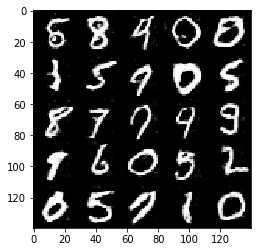

Epoch 5/5... Discriminator Loss: 0.7622... Generator Loss: 0.9576
Epoch 5/5... Discriminator Loss: 0.6409... Generator Loss: 1.9486
Epoch 5/5... Discriminator Loss: 0.4007... Generator Loss: 2.3880
Epoch 5/5... Discriminator Loss: 0.3974... Generator Loss: 2.1669
Epoch 5/5... Discriminator Loss: 0.5538... Generator Loss: 1.1826
Epoch 5/5... Discriminator Loss: 0.3520... Generator Loss: 1.6599
Epoch 5/5... Discriminator Loss: 0.6256... Generator Loss: 1.0064
Epoch 5/5... Discriminator Loss: 0.5671... Generator Loss: 1.1392
Epoch 5/5... Discriminator Loss: 0.5141... Generator Loss: 1.4081
Epoch 5/5... Discriminator Loss: 1.4269... Generator Loss: 0.5529


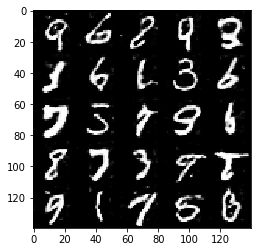

Epoch 5/5... Discriminator Loss: 0.4876... Generator Loss: 1.3752
Epoch 5/5... Discriminator Loss: 0.4021... Generator Loss: 1.5206
Epoch 5/5... Discriminator Loss: 1.1614... Generator Loss: 0.6245
Epoch 5/5... Discriminator Loss: 0.4088... Generator Loss: 1.5716
Epoch 5/5... Discriminator Loss: 0.4976... Generator Loss: 1.3004
Epoch 5/5... Discriminator Loss: 0.5322... Generator Loss: 1.1821
Epoch 5/5... Discriminator Loss: 0.4711... Generator Loss: 1.5798
Epoch 5/5... Discriminator Loss: 0.4427... Generator Loss: 1.5081
Epoch 5/5... Discriminator Loss: 0.3516... Generator Loss: 2.8977
Epoch 5/5... Discriminator Loss: 0.3859... Generator Loss: 2.7237


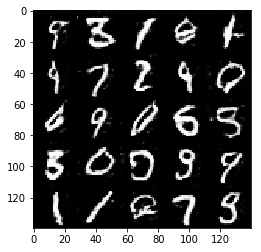

Epoch 5/5... Discriminator Loss: 0.5406... Generator Loss: 1.1307
Epoch 5/5... Discriminator Loss: 0.8101... Generator Loss: 1.0222
Epoch 5/5... Discriminator Loss: 0.3704... Generator Loss: 2.0850
Epoch 5/5... Discriminator Loss: 0.7511... Generator Loss: 0.9207
Epoch 5/5... Discriminator Loss: 0.3203... Generator Loss: 1.8843
Epoch 5/5... Discriminator Loss: 1.2150... Generator Loss: 0.6528
Epoch 5/5... Discriminator Loss: 0.8764... Generator Loss: 0.7675
Epoch 5/5... Discriminator Loss: 0.5886... Generator Loss: 1.2502
Epoch 5/5... Discriminator Loss: 0.3239... Generator Loss: 2.0697
Epoch 5/5... Discriminator Loss: 0.6340... Generator Loss: 1.1041


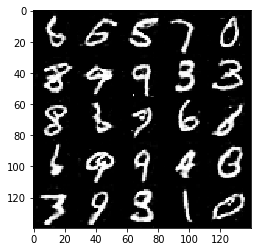

Epoch 5/5... Discriminator Loss: 0.3908... Generator Loss: 1.7081
Epoch 5/5... Discriminator Loss: 1.2326... Generator Loss: 0.5387
Epoch 5/5... Discriminator Loss: 1.7399... Generator Loss: 0.4297
Epoch 5/5... Discriminator Loss: 0.5277... Generator Loss: 1.1725
Epoch 5/5... Discriminator Loss: 0.4808... Generator Loss: 1.2958
Epoch 5/5... Discriminator Loss: 0.4569... Generator Loss: 1.6854
Epoch 5/5... Discriminator Loss: 0.3478... Generator Loss: 2.2569
Epoch 5/5... Discriminator Loss: 0.5717... Generator Loss: 1.2470
Epoch 5/5... Discriminator Loss: 0.8814... Generator Loss: 0.7861
Epoch 5/5... Discriminator Loss: 0.6084... Generator Loss: 1.2803


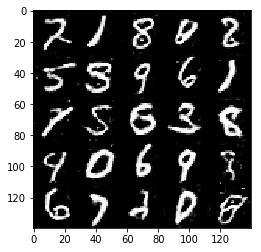

Epoch 5/5... Discriminator Loss: 0.4027... Generator Loss: 1.6565
Epoch 5/5... Discriminator Loss: 0.3797... Generator Loss: 1.5576
Epoch 5/5... Discriminator Loss: 0.5645... Generator Loss: 1.5702
Epoch 5/5... Discriminator Loss: 0.9883... Generator Loss: 0.7264
Epoch 5/5... Discriminator Loss: 0.6021... Generator Loss: 2.1596
Epoch 5/5... Discriminator Loss: 0.7048... Generator Loss: 1.0872
Epoch 5/5... Discriminator Loss: 1.8130... Generator Loss: 5.5964
Epoch 5/5... Discriminator Loss: 0.5421... Generator Loss: 2.1021
Epoch 5/5... Discriminator Loss: 0.6065... Generator Loss: 1.0547
Epoch 5/5... Discriminator Loss: 0.9257... Generator Loss: 0.7274


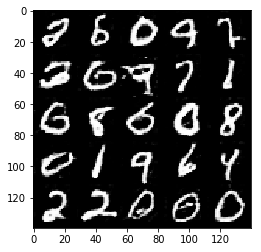

Epoch 5/5... Discriminator Loss: 0.5884... Generator Loss: 1.0967
Epoch 5/5... Discriminator Loss: 0.6711... Generator Loss: 1.1312
Epoch 5/5... Discriminator Loss: 0.4939... Generator Loss: 1.4922
Epoch 5/5... Discriminator Loss: 0.3690... Generator Loss: 1.4994
Epoch 5/5... Discriminator Loss: 0.3258... Generator Loss: 1.7195
Epoch 5/5... Discriminator Loss: 1.0092... Generator Loss: 0.7320
Epoch 5/5... Discriminator Loss: 0.5479... Generator Loss: 1.1347
Epoch 5/5... Discriminator Loss: 1.0752... Generator Loss: 0.6375
Epoch 5/5... Discriminator Loss: 0.3082... Generator Loss: 1.7960
Epoch 5/5... Discriminator Loss: 0.4988... Generator Loss: 1.2948


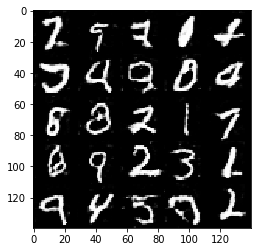

Epoch 5/5... Discriminator Loss: 0.5130... Generator Loss: 1.3302
Epoch 5/5... Discriminator Loss: 1.1988... Generator Loss: 0.6211
Epoch 5/5... Discriminator Loss: 0.2010... Generator Loss: 2.7485
Epoch 5/5... Discriminator Loss: 0.5848... Generator Loss: 1.2050
Epoch 5/5... Discriminator Loss: 0.3765... Generator Loss: 1.6085
Epoch 5/5... Discriminator Loss: 0.4657... Generator Loss: 1.2668
Epoch 5/5... Discriminator Loss: 0.7793... Generator Loss: 0.8551
Epoch 5/5... Discriminator Loss: 1.2056... Generator Loss: 4.0354


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 1.4376... Generator Loss: 0.5619
Epoch 1/5... Discriminator Loss: 0.3506... Generator Loss: 2.3388
Epoch 1/5... Discriminator Loss: 0.2457... Generator Loss: 3.6710
Epoch 1/5... Discriminator Loss: 0.2895... Generator Loss: 2.2708
Epoch 1/5... Discriminator Loss: 0.1340... Generator Loss: 4.6172
Epoch 1/5... Discriminator Loss: 0.1574... Generator Loss: 3.9152
Epoch 1/5... Discriminator Loss: 1.1686... Generator Loss: 12.2968
Epoch 1/5... Discriminator Loss: 0.6147... Generator Loss: 10.2273
Epoch 1/5... Discriminator Loss: 0.5685... Generator Loss: 9.8086
Epoch 1/5... Discriminator Loss: 0.5590... Generator Loss: 1.6042


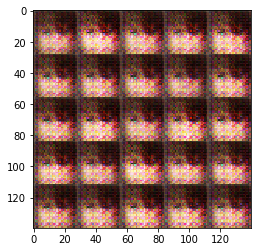

Epoch 1/5... Discriminator Loss: 0.1943... Generator Loss: 2.9818
Epoch 1/5... Discriminator Loss: 0.2648... Generator Loss: 3.4148
Epoch 1/5... Discriminator Loss: 0.4043... Generator Loss: 1.3766
Epoch 1/5... Discriminator Loss: 0.2315... Generator Loss: 5.7369
Epoch 1/5... Discriminator Loss: 0.4409... Generator Loss: 1.6004
Epoch 1/5... Discriminator Loss: 0.8720... Generator Loss: 5.6047
Epoch 1/5... Discriminator Loss: 0.3122... Generator Loss: 2.4567
Epoch 1/5... Discriminator Loss: 0.5678... Generator Loss: 0.9990
Epoch 1/5... Discriminator Loss: 1.1909... Generator Loss: 5.7627
Epoch 1/5... Discriminator Loss: 0.3721... Generator Loss: 5.6017


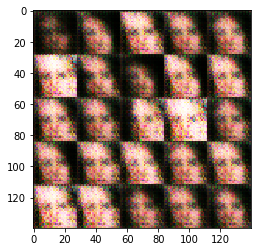

Epoch 1/5... Discriminator Loss: 0.4604... Generator Loss: 1.5230
Epoch 1/5... Discriminator Loss: 0.4128... Generator Loss: 1.4898
Epoch 1/5... Discriminator Loss: 0.4319... Generator Loss: 2.8064
Epoch 1/5... Discriminator Loss: 0.5478... Generator Loss: 1.4960
Epoch 1/5... Discriminator Loss: 0.4314... Generator Loss: 2.0650
Epoch 1/5... Discriminator Loss: 0.4795... Generator Loss: 2.5425
Epoch 1/5... Discriminator Loss: 0.8402... Generator Loss: 0.7550
Epoch 1/5... Discriminator Loss: 1.0039... Generator Loss: 3.7085
Epoch 1/5... Discriminator Loss: 0.8304... Generator Loss: 0.9450
Epoch 1/5... Discriminator Loss: 1.5633... Generator Loss: 0.3885


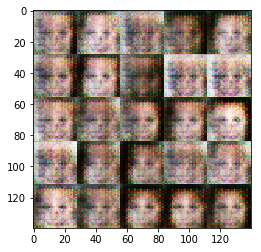

Epoch 1/5... Discriminator Loss: 1.2808... Generator Loss: 2.0914
Epoch 1/5... Discriminator Loss: 0.5644... Generator Loss: 1.6265
Epoch 1/5... Discriminator Loss: 0.7265... Generator Loss: 1.7397
Epoch 1/5... Discriminator Loss: 0.9478... Generator Loss: 2.3483
Epoch 1/5... Discriminator Loss: 0.7913... Generator Loss: 1.0452
Epoch 1/5... Discriminator Loss: 0.9789... Generator Loss: 2.3335
Epoch 1/5... Discriminator Loss: 0.8143... Generator Loss: 1.0286
Epoch 1/5... Discriminator Loss: 0.7222... Generator Loss: 1.1023
Epoch 1/5... Discriminator Loss: 0.9035... Generator Loss: 1.9455
Epoch 1/5... Discriminator Loss: 0.8369... Generator Loss: 1.4952


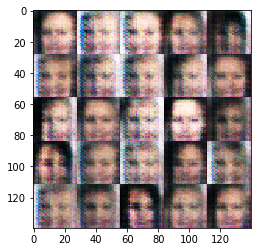

Epoch 1/5... Discriminator Loss: 1.1212... Generator Loss: 1.7584
Epoch 1/5... Discriminator Loss: 0.9028... Generator Loss: 2.2708
Epoch 1/5... Discriminator Loss: 0.6002... Generator Loss: 1.7172
Epoch 1/5... Discriminator Loss: 1.2938... Generator Loss: 0.5695
Epoch 1/5... Discriminator Loss: 0.9729... Generator Loss: 1.3347
Epoch 1/5... Discriminator Loss: 0.6587... Generator Loss: 1.2981
Epoch 1/5... Discriminator Loss: 0.8663... Generator Loss: 1.0445
Epoch 1/5... Discriminator Loss: 0.8383... Generator Loss: 1.0675
Epoch 1/5... Discriminator Loss: 0.8849... Generator Loss: 1.2346
Epoch 1/5... Discriminator Loss: 1.2929... Generator Loss: 1.2449


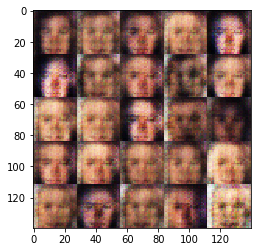

Epoch 1/5... Discriminator Loss: 1.1525... Generator Loss: 0.6288
Epoch 1/5... Discriminator Loss: 0.5841... Generator Loss: 1.5955
Epoch 1/5... Discriminator Loss: 0.8285... Generator Loss: 1.3380
Epoch 1/5... Discriminator Loss: 0.8159... Generator Loss: 1.4740
Epoch 1/5... Discriminator Loss: 1.1743... Generator Loss: 1.0367
Epoch 1/5... Discriminator Loss: 0.8169... Generator Loss: 1.2480
Epoch 1/5... Discriminator Loss: 0.7190... Generator Loss: 1.4128
Epoch 1/5... Discriminator Loss: 0.7093... Generator Loss: 1.5902
Epoch 1/5... Discriminator Loss: 0.7746... Generator Loss: 1.3772
Epoch 1/5... Discriminator Loss: 1.0724... Generator Loss: 0.8624


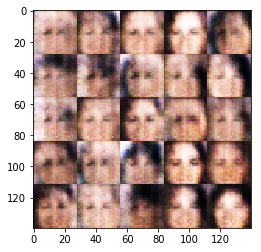

Epoch 1/5... Discriminator Loss: 0.8717... Generator Loss: 1.0223
Epoch 1/5... Discriminator Loss: 0.6775... Generator Loss: 1.4067
Epoch 1/5... Discriminator Loss: 0.6018... Generator Loss: 1.4007
Epoch 1/5... Discriminator Loss: 0.8701... Generator Loss: 0.8909
Epoch 1/5... Discriminator Loss: 1.0452... Generator Loss: 0.7655
Epoch 1/5... Discriminator Loss: 0.9677... Generator Loss: 1.0586
Epoch 1/5... Discriminator Loss: 0.8990... Generator Loss: 2.2894
Epoch 1/5... Discriminator Loss: 0.7373... Generator Loss: 1.1485
Epoch 1/5... Discriminator Loss: 0.8081... Generator Loss: 1.0513
Epoch 1/5... Discriminator Loss: 0.5020... Generator Loss: 1.9810


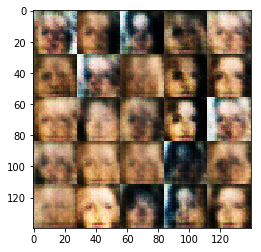

Epoch 1/5... Discriminator Loss: 1.0622... Generator Loss: 0.9092
Epoch 1/5... Discriminator Loss: 0.7759... Generator Loss: 1.1127
Epoch 1/5... Discriminator Loss: 0.7027... Generator Loss: 1.3337
Epoch 1/5... Discriminator Loss: 0.5705... Generator Loss: 1.4306
Epoch 1/5... Discriminator Loss: 0.6558... Generator Loss: 1.3946
Epoch 1/5... Discriminator Loss: 0.9105... Generator Loss: 2.7866
Epoch 1/5... Discriminator Loss: 0.7276... Generator Loss: 1.2621
Epoch 1/5... Discriminator Loss: 1.0345... Generator Loss: 0.6806
Epoch 1/5... Discriminator Loss: 1.0148... Generator Loss: 0.9693
Epoch 1/5... Discriminator Loss: 1.3042... Generator Loss: 0.7747


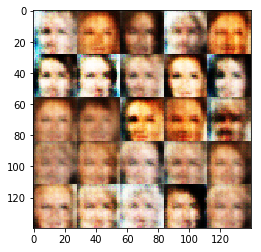

Epoch 1/5... Discriminator Loss: 0.6562... Generator Loss: 1.5104
Epoch 1/5... Discriminator Loss: 0.6915... Generator Loss: 1.7888
Epoch 1/5... Discriminator Loss: 0.8069... Generator Loss: 1.2724
Epoch 1/5... Discriminator Loss: 0.9791... Generator Loss: 0.9584
Epoch 1/5... Discriminator Loss: 0.5439... Generator Loss: 1.7342
Epoch 1/5... Discriminator Loss: 0.6740... Generator Loss: 1.7851
Epoch 1/5... Discriminator Loss: 0.8555... Generator Loss: 1.0377
Epoch 1/5... Discriminator Loss: 1.0246... Generator Loss: 0.9888
Epoch 1/5... Discriminator Loss: 0.9828... Generator Loss: 0.8987
Epoch 1/5... Discriminator Loss: 0.7821... Generator Loss: 1.3296


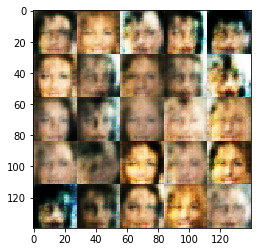

Epoch 1/5... Discriminator Loss: 0.6707... Generator Loss: 1.6646
Epoch 1/5... Discriminator Loss: 0.8108... Generator Loss: 1.0753
Epoch 1/5... Discriminator Loss: 0.7295... Generator Loss: 1.2866
Epoch 1/5... Discriminator Loss: 0.8253... Generator Loss: 1.2902
Epoch 1/5... Discriminator Loss: 0.8639... Generator Loss: 1.1463
Epoch 1/5... Discriminator Loss: 1.0023... Generator Loss: 1.0839
Epoch 1/5... Discriminator Loss: 1.0871... Generator Loss: 1.6642
Epoch 1/5... Discriminator Loss: 0.9090... Generator Loss: 1.9139
Epoch 1/5... Discriminator Loss: 1.1203... Generator Loss: 1.1938
Epoch 1/5... Discriminator Loss: 0.8608... Generator Loss: 1.4543


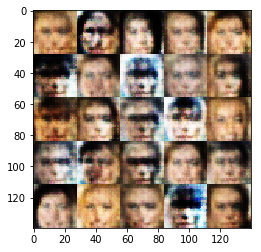

Epoch 1/5... Discriminator Loss: 1.0586... Generator Loss: 0.6708
Epoch 1/5... Discriminator Loss: 0.8628... Generator Loss: 1.1801
Epoch 1/5... Discriminator Loss: 1.4820... Generator Loss: 2.7357
Epoch 1/5... Discriminator Loss: 0.8168... Generator Loss: 1.3627
Epoch 1/5... Discriminator Loss: 1.0510... Generator Loss: 1.1513
Epoch 1/5... Discriminator Loss: 1.0295... Generator Loss: 1.9014
Epoch 1/5... Discriminator Loss: 0.8544... Generator Loss: 1.3318
Epoch 1/5... Discriminator Loss: 0.8797... Generator Loss: 1.2311
Epoch 1/5... Discriminator Loss: 0.9414... Generator Loss: 1.9638
Epoch 1/5... Discriminator Loss: 1.2231... Generator Loss: 0.7504


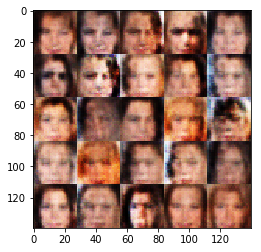

Epoch 1/5... Discriminator Loss: 1.3504... Generator Loss: 0.4389
Epoch 1/5... Discriminator Loss: 1.2256... Generator Loss: 0.6834
Epoch 1/5... Discriminator Loss: 0.8111... Generator Loss: 1.9781
Epoch 1/5... Discriminator Loss: 1.0500... Generator Loss: 0.8577
Epoch 1/5... Discriminator Loss: 0.7503... Generator Loss: 1.4759
Epoch 1/5... Discriminator Loss: 0.7491... Generator Loss: 1.2721
Epoch 1/5... Discriminator Loss: 0.9635... Generator Loss: 0.9672
Epoch 1/5... Discriminator Loss: 1.0118... Generator Loss: 1.4665
Epoch 1/5... Discriminator Loss: 0.9864... Generator Loss: 1.2770
Epoch 1/5... Discriminator Loss: 0.9158... Generator Loss: 1.1011


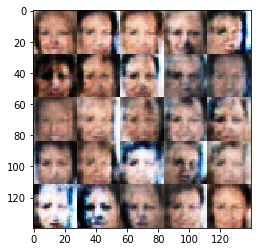

Epoch 1/5... Discriminator Loss: 0.8688... Generator Loss: 1.9677
Epoch 1/5... Discriminator Loss: 1.3446... Generator Loss: 0.4853
Epoch 1/5... Discriminator Loss: 0.8549... Generator Loss: 1.7589
Epoch 1/5... Discriminator Loss: 0.9995... Generator Loss: 1.4374
Epoch 1/5... Discriminator Loss: 0.7983... Generator Loss: 1.0790
Epoch 1/5... Discriminator Loss: 1.1084... Generator Loss: 0.6695
Epoch 1/5... Discriminator Loss: 0.7181... Generator Loss: 1.3838
Epoch 1/5... Discriminator Loss: 0.8901... Generator Loss: 0.9354
Epoch 1/5... Discriminator Loss: 1.1813... Generator Loss: 0.5534
Epoch 1/5... Discriminator Loss: 0.8566... Generator Loss: 1.1172


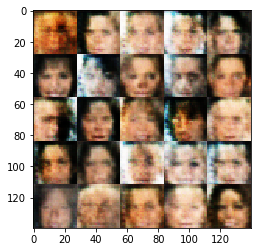

Epoch 1/5... Discriminator Loss: 0.7547... Generator Loss: 1.8507
Epoch 1/5... Discriminator Loss: 0.8176... Generator Loss: 1.0841
Epoch 1/5... Discriminator Loss: 0.8200... Generator Loss: 1.7346
Epoch 1/5... Discriminator Loss: 0.6853... Generator Loss: 1.0532
Epoch 1/5... Discriminator Loss: 0.9940... Generator Loss: 1.0879
Epoch 1/5... Discriminator Loss: 1.0999... Generator Loss: 0.6765
Epoch 1/5... Discriminator Loss: 0.9103... Generator Loss: 0.9277
Epoch 1/5... Discriminator Loss: 0.9461... Generator Loss: 1.0363
Epoch 1/5... Discriminator Loss: 1.0146... Generator Loss: 0.8989
Epoch 1/5... Discriminator Loss: 1.0628... Generator Loss: 2.0044


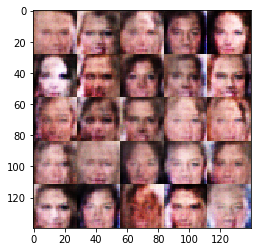

Epoch 1/5... Discriminator Loss: 1.3196... Generator Loss: 1.7458
Epoch 1/5... Discriminator Loss: 0.8458... Generator Loss: 1.8959
Epoch 1/5... Discriminator Loss: 1.3294... Generator Loss: 0.5102
Epoch 1/5... Discriminator Loss: 0.8103... Generator Loss: 1.3066
Epoch 1/5... Discriminator Loss: 0.8206... Generator Loss: 0.9445
Epoch 1/5... Discriminator Loss: 0.6443... Generator Loss: 1.5379
Epoch 1/5... Discriminator Loss: 1.0779... Generator Loss: 0.8423
Epoch 1/5... Discriminator Loss: 0.6660... Generator Loss: 1.6007
Epoch 1/5... Discriminator Loss: 0.7181... Generator Loss: 1.1594
Epoch 1/5... Discriminator Loss: 1.0132... Generator Loss: 1.5949


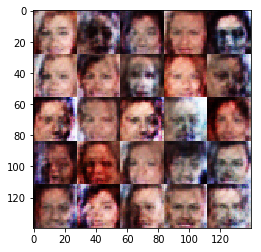

Epoch 1/5... Discriminator Loss: 0.6824... Generator Loss: 1.5076
Epoch 1/5... Discriminator Loss: 0.9702... Generator Loss: 1.0900
Epoch 1/5... Discriminator Loss: 0.8572... Generator Loss: 1.1223
Epoch 1/5... Discriminator Loss: 0.8181... Generator Loss: 1.2341
Epoch 1/5... Discriminator Loss: 0.8284... Generator Loss: 1.8819
Epoch 1/5... Discriminator Loss: 0.7529... Generator Loss: 1.5069
Epoch 1/5... Discriminator Loss: 0.8674... Generator Loss: 1.7385
Epoch 1/5... Discriminator Loss: 0.7502... Generator Loss: 1.1484
Epoch 1/5... Discriminator Loss: 0.7940... Generator Loss: 1.3180
Epoch 1/5... Discriminator Loss: 0.7137... Generator Loss: 1.3263


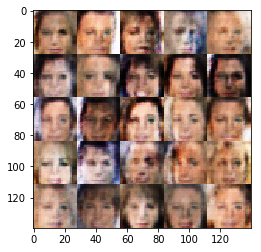

Epoch 1/5... Discriminator Loss: 0.7846... Generator Loss: 1.3681
Epoch 1/5... Discriminator Loss: 0.6982... Generator Loss: 1.8284
Epoch 1/5... Discriminator Loss: 0.9632... Generator Loss: 1.1604
Epoch 1/5... Discriminator Loss: 0.8704... Generator Loss: 1.3397
Epoch 1/5... Discriminator Loss: 0.8957... Generator Loss: 1.6518
Epoch 1/5... Discriminator Loss: 0.8000... Generator Loss: 1.0966
Epoch 1/5... Discriminator Loss: 0.8423... Generator Loss: 1.2629
Epoch 1/5... Discriminator Loss: 0.7075... Generator Loss: 1.4831
Epoch 1/5... Discriminator Loss: 1.0065... Generator Loss: 0.8102
Epoch 1/5... Discriminator Loss: 0.9114... Generator Loss: 0.9640


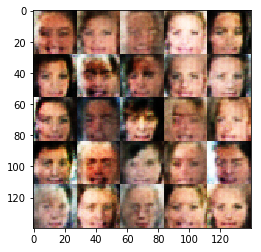

Epoch 1/5... Discriminator Loss: 1.0054... Generator Loss: 0.9346
Epoch 1/5... Discriminator Loss: 0.7823... Generator Loss: 1.2272
Epoch 1/5... Discriminator Loss: 0.9216... Generator Loss: 1.0532
Epoch 1/5... Discriminator Loss: 1.2191... Generator Loss: 0.6311
Epoch 1/5... Discriminator Loss: 1.1495... Generator Loss: 0.5759
Epoch 1/5... Discriminator Loss: 0.9913... Generator Loss: 0.7465
Epoch 1/5... Discriminator Loss: 0.8336... Generator Loss: 2.2018
Epoch 1/5... Discriminator Loss: 1.0396... Generator Loss: 0.9219
Epoch 1/5... Discriminator Loss: 0.8843... Generator Loss: 1.4009
Epoch 1/5... Discriminator Loss: 1.2498... Generator Loss: 0.5951


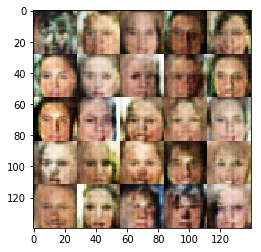

Epoch 1/5... Discriminator Loss: 0.8979... Generator Loss: 1.0006
Epoch 1/5... Discriminator Loss: 1.0814... Generator Loss: 0.8408
Epoch 1/5... Discriminator Loss: 0.8938... Generator Loss: 1.0803
Epoch 1/5... Discriminator Loss: 1.0245... Generator Loss: 1.1855
Epoch 1/5... Discriminator Loss: 0.9013... Generator Loss: 1.7185
Epoch 1/5... Discriminator Loss: 1.2768... Generator Loss: 0.5283
Epoch 1/5... Discriminator Loss: 0.9486... Generator Loss: 2.0272
Epoch 1/5... Discriminator Loss: 0.9532... Generator Loss: 0.7459
Epoch 1/5... Discriminator Loss: 0.9535... Generator Loss: 1.5096
Epoch 1/5... Discriminator Loss: 0.8263... Generator Loss: 1.6707


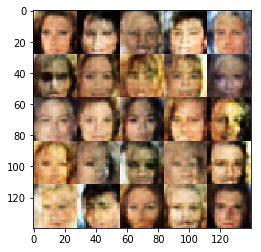

Epoch 1/5... Discriminator Loss: 1.0043... Generator Loss: 0.8173
Epoch 1/5... Discriminator Loss: 0.9557... Generator Loss: 1.6914
Epoch 1/5... Discriminator Loss: 0.7469... Generator Loss: 1.5351
Epoch 1/5... Discriminator Loss: 0.9186... Generator Loss: 0.9258
Epoch 1/5... Discriminator Loss: 0.8221... Generator Loss: 1.2080
Epoch 1/5... Discriminator Loss: 0.8514... Generator Loss: 0.9012
Epoch 1/5... Discriminator Loss: 1.0351... Generator Loss: 1.1600
Epoch 1/5... Discriminator Loss: 0.8485... Generator Loss: 0.9228
Epoch 1/5... Discriminator Loss: 0.9937... Generator Loss: 1.1453
Epoch 1/5... Discriminator Loss: 0.9164... Generator Loss: 1.3349


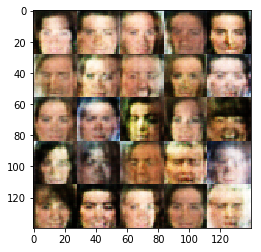

Epoch 1/5... Discriminator Loss: 1.0608... Generator Loss: 0.7901
Epoch 1/5... Discriminator Loss: 0.9700... Generator Loss: 1.0794
Epoch 1/5... Discriminator Loss: 0.8074... Generator Loss: 1.2518
Epoch 1/5... Discriminator Loss: 1.0573... Generator Loss: 0.8089
Epoch 1/5... Discriminator Loss: 0.8570... Generator Loss: 1.2518
Epoch 1/5... Discriminator Loss: 0.7170... Generator Loss: 1.1959
Epoch 1/5... Discriminator Loss: 0.8273... Generator Loss: 1.3999
Epoch 1/5... Discriminator Loss: 0.7417... Generator Loss: 1.4108
Epoch 1/5... Discriminator Loss: 0.9032... Generator Loss: 1.0964
Epoch 1/5... Discriminator Loss: 1.0437... Generator Loss: 0.7498


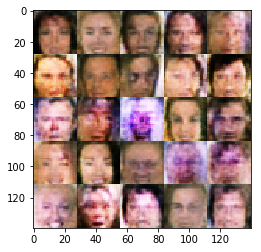

Epoch 1/5... Discriminator Loss: 0.9332... Generator Loss: 1.2040
Epoch 1/5... Discriminator Loss: 0.9935... Generator Loss: 0.7912
Epoch 1/5... Discriminator Loss: 1.3497... Generator Loss: 0.5986
Epoch 1/5... Discriminator Loss: 1.1754... Generator Loss: 1.1643
Epoch 1/5... Discriminator Loss: 1.0981... Generator Loss: 1.0334
Epoch 1/5... Discriminator Loss: 1.0044... Generator Loss: 0.7775
Epoch 1/5... Discriminator Loss: 1.1476... Generator Loss: 0.7027
Epoch 1/5... Discriminator Loss: 0.6820... Generator Loss: 1.2093
Epoch 1/5... Discriminator Loss: 0.9359... Generator Loss: 1.9471
Epoch 1/5... Discriminator Loss: 1.2132... Generator Loss: 1.4442


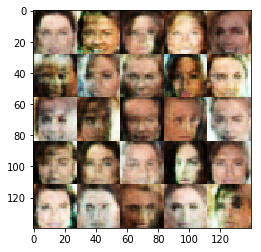

Epoch 1/5... Discriminator Loss: 1.1364... Generator Loss: 0.6204
Epoch 1/5... Discriminator Loss: 0.8736... Generator Loss: 0.8815
Epoch 1/5... Discriminator Loss: 0.9302... Generator Loss: 0.9086
Epoch 1/5... Discriminator Loss: 1.0276... Generator Loss: 0.7352
Epoch 1/5... Discriminator Loss: 0.8468... Generator Loss: 1.0458
Epoch 1/5... Discriminator Loss: 1.0832... Generator Loss: 0.6079
Epoch 1/5... Discriminator Loss: 0.7867... Generator Loss: 1.0633
Epoch 1/5... Discriminator Loss: 1.0597... Generator Loss: 0.6892
Epoch 1/5... Discriminator Loss: 1.0102... Generator Loss: 0.9863
Epoch 1/5... Discriminator Loss: 1.0251... Generator Loss: 0.9581


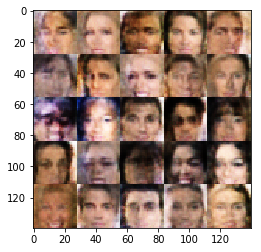

Epoch 1/5... Discriminator Loss: 0.9682... Generator Loss: 0.8562
Epoch 1/5... Discriminator Loss: 0.9646... Generator Loss: 1.0686
Epoch 1/5... Discriminator Loss: 0.7939... Generator Loss: 1.1220
Epoch 1/5... Discriminator Loss: 0.7335... Generator Loss: 1.3421
Epoch 1/5... Discriminator Loss: 0.6515... Generator Loss: 1.3956
Epoch 1/5... Discriminator Loss: 1.0281... Generator Loss: 1.4213
Epoch 1/5... Discriminator Loss: 1.0154... Generator Loss: 0.8502
Epoch 1/5... Discriminator Loss: 0.8392... Generator Loss: 1.4276
Epoch 1/5... Discriminator Loss: 1.1473... Generator Loss: 0.6067
Epoch 1/5... Discriminator Loss: 1.0276... Generator Loss: 1.0679


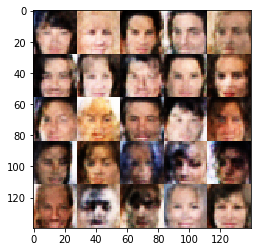

Epoch 1/5... Discriminator Loss: 0.8344... Generator Loss: 1.3364
Epoch 1/5... Discriminator Loss: 0.8247... Generator Loss: 1.1531
Epoch 1/5... Discriminator Loss: 1.2379... Generator Loss: 0.9726
Epoch 1/5... Discriminator Loss: 0.9223... Generator Loss: 0.8503
Epoch 1/5... Discriminator Loss: 0.6940... Generator Loss: 1.4772
Epoch 1/5... Discriminator Loss: 1.0965... Generator Loss: 1.2191
Epoch 1/5... Discriminator Loss: 1.2705... Generator Loss: 0.6104
Epoch 1/5... Discriminator Loss: 0.8804... Generator Loss: 1.6428
Epoch 1/5... Discriminator Loss: 0.8859... Generator Loss: 1.2167
Epoch 1/5... Discriminator Loss: 1.1276... Generator Loss: 0.6688


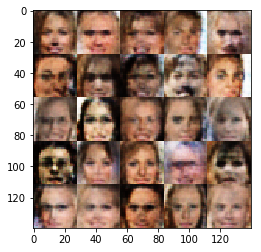

Epoch 1/5... Discriminator Loss: 0.8467... Generator Loss: 1.1303
Epoch 1/5... Discriminator Loss: 0.8931... Generator Loss: 1.1449
Epoch 1/5... Discriminator Loss: 0.7614... Generator Loss: 1.1443
Epoch 1/5... Discriminator Loss: 0.8269... Generator Loss: 1.0730
Epoch 1/5... Discriminator Loss: 0.8196... Generator Loss: 1.0478
Epoch 1/5... Discriminator Loss: 1.3236... Generator Loss: 0.5342
Epoch 1/5... Discriminator Loss: 1.0361... Generator Loss: 0.7033
Epoch 1/5... Discriminator Loss: 1.1047... Generator Loss: 0.6719
Epoch 1/5... Discriminator Loss: 0.9606... Generator Loss: 1.7528
Epoch 1/5... Discriminator Loss: 1.0337... Generator Loss: 0.6429


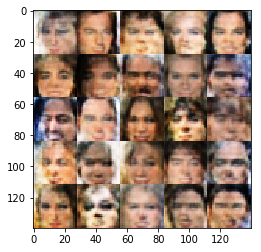

Epoch 1/5... Discriminator Loss: 0.8925... Generator Loss: 1.3924
Epoch 1/5... Discriminator Loss: 1.1499... Generator Loss: 0.5808
Epoch 1/5... Discriminator Loss: 0.8732... Generator Loss: 1.0954
Epoch 1/5... Discriminator Loss: 1.0288... Generator Loss: 1.0414
Epoch 1/5... Discriminator Loss: 1.0885... Generator Loss: 1.0957
Epoch 1/5... Discriminator Loss: 0.7859... Generator Loss: 1.6906
Epoch 1/5... Discriminator Loss: 0.9081... Generator Loss: 1.2231
Epoch 1/5... Discriminator Loss: 1.6720... Generator Loss: 0.2778
Epoch 1/5... Discriminator Loss: 1.0313... Generator Loss: 1.0641
Epoch 1/5... Discriminator Loss: 0.9958... Generator Loss: 0.8200


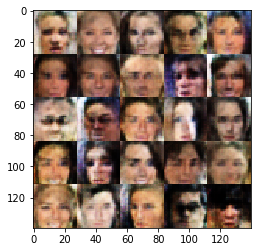

Epoch 1/5... Discriminator Loss: 0.7152... Generator Loss: 1.4838
Epoch 1/5... Discriminator Loss: 1.0113... Generator Loss: 1.1218
Epoch 1/5... Discriminator Loss: 0.9043... Generator Loss: 0.9884
Epoch 1/5... Discriminator Loss: 0.8352... Generator Loss: 1.1169
Epoch 1/5... Discriminator Loss: 0.7909... Generator Loss: 1.8100
Epoch 1/5... Discriminator Loss: 0.9041... Generator Loss: 0.8347
Epoch 1/5... Discriminator Loss: 1.1650... Generator Loss: 0.5950
Epoch 1/5... Discriminator Loss: 1.0723... Generator Loss: 1.2870
Epoch 1/5... Discriminator Loss: 0.8632... Generator Loss: 1.0408
Epoch 1/5... Discriminator Loss: 1.1499... Generator Loss: 1.2196


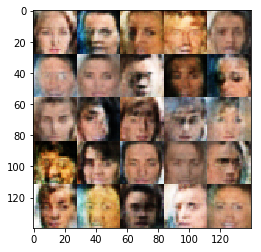

Epoch 1/5... Discriminator Loss: 1.0215... Generator Loss: 0.9276
Epoch 1/5... Discriminator Loss: 0.8542... Generator Loss: 0.9270
Epoch 1/5... Discriminator Loss: 0.8307... Generator Loss: 1.0010
Epoch 1/5... Discriminator Loss: 0.8989... Generator Loss: 1.0240
Epoch 1/5... Discriminator Loss: 0.9816... Generator Loss: 0.8232
Epoch 1/5... Discriminator Loss: 0.8957... Generator Loss: 0.9278
Epoch 1/5... Discriminator Loss: 1.1528... Generator Loss: 0.6270
Epoch 1/5... Discriminator Loss: 1.0375... Generator Loss: 0.8719
Epoch 1/5... Discriminator Loss: 1.1112... Generator Loss: 0.6392
Epoch 1/5... Discriminator Loss: 1.3382... Generator Loss: 0.6015


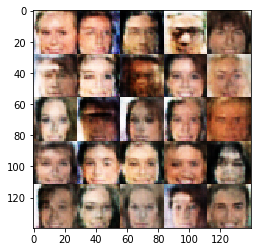

Epoch 1/5... Discriminator Loss: 1.0783... Generator Loss: 0.7938
Epoch 1/5... Discriminator Loss: 1.1218... Generator Loss: 0.5906
Epoch 1/5... Discriminator Loss: 1.0473... Generator Loss: 0.7278
Epoch 1/5... Discriminator Loss: 0.8001... Generator Loss: 1.1495
Epoch 1/5... Discriminator Loss: 0.9298... Generator Loss: 0.8552
Epoch 1/5... Discriminator Loss: 1.0446... Generator Loss: 2.0015
Epoch 1/5... Discriminator Loss: 0.8788... Generator Loss: 1.5824
Epoch 1/5... Discriminator Loss: 1.0246... Generator Loss: 0.7139
Epoch 1/5... Discriminator Loss: 0.8836... Generator Loss: 1.1908
Epoch 1/5... Discriminator Loss: 0.8629... Generator Loss: 1.9143


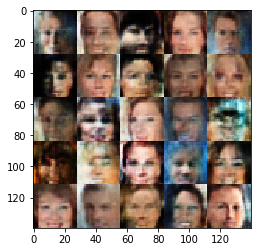

Epoch 1/5... Discriminator Loss: 0.9817... Generator Loss: 0.7698
Epoch 1/5... Discriminator Loss: 0.7065... Generator Loss: 1.3785
Epoch 1/5... Discriminator Loss: 1.1160... Generator Loss: 1.0641
Epoch 1/5... Discriminator Loss: 0.7876... Generator Loss: 1.9291
Epoch 1/5... Discriminator Loss: 0.9492... Generator Loss: 1.5251
Epoch 1/5... Discriminator Loss: 0.9018... Generator Loss: 0.9606
Epoch 1/5... Discriminator Loss: 0.8963... Generator Loss: 1.7404
Epoch 1/5... Discriminator Loss: 0.9326... Generator Loss: 1.5117
Epoch 1/5... Discriminator Loss: 0.9577... Generator Loss: 1.1866
Epoch 1/5... Discriminator Loss: 1.5129... Generator Loss: 0.4574


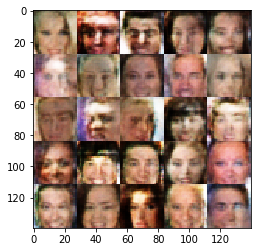

Epoch 1/5... Discriminator Loss: 0.9635... Generator Loss: 0.7699
Epoch 1/5... Discriminator Loss: 1.3078... Generator Loss: 0.6462
Epoch 1/5... Discriminator Loss: 1.0448... Generator Loss: 0.6631
Epoch 1/5... Discriminator Loss: 0.7685... Generator Loss: 1.1442
Epoch 1/5... Discriminator Loss: 0.8330... Generator Loss: 1.1625
Epoch 1/5... Discriminator Loss: 1.2461... Generator Loss: 0.5158
Epoch 2/5... Discriminator Loss: 0.8928... Generator Loss: 1.2317
Epoch 2/5... Discriminator Loss: 0.8124... Generator Loss: 1.7749
Epoch 2/5... Discriminator Loss: 1.1212... Generator Loss: 1.8866
Epoch 2/5... Discriminator Loss: 0.9513... Generator Loss: 1.3492


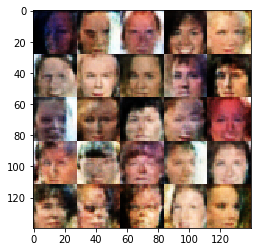

Epoch 2/5... Discriminator Loss: 1.1478... Generator Loss: 0.8277
Epoch 2/5... Discriminator Loss: 1.0229... Generator Loss: 0.9070
Epoch 2/5... Discriminator Loss: 0.9388... Generator Loss: 1.0951
Epoch 2/5... Discriminator Loss: 0.9038... Generator Loss: 1.0161
Epoch 2/5... Discriminator Loss: 0.9651... Generator Loss: 1.2794
Epoch 2/5... Discriminator Loss: 1.1729... Generator Loss: 0.5359
Epoch 2/5... Discriminator Loss: 0.8271... Generator Loss: 1.2141
Epoch 2/5... Discriminator Loss: 0.9409... Generator Loss: 0.8072
Epoch 2/5... Discriminator Loss: 0.7603... Generator Loss: 1.5233
Epoch 2/5... Discriminator Loss: 0.9406... Generator Loss: 1.4364


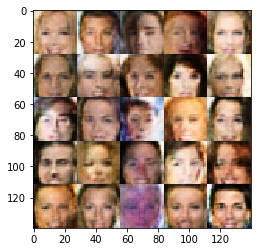

Epoch 2/5... Discriminator Loss: 0.9876... Generator Loss: 1.0370
Epoch 2/5... Discriminator Loss: 0.8874... Generator Loss: 1.3630
Epoch 2/5... Discriminator Loss: 0.8051... Generator Loss: 1.4223
Epoch 2/5... Discriminator Loss: 0.8740... Generator Loss: 1.6068
Epoch 2/5... Discriminator Loss: 0.7767... Generator Loss: 1.5867
Epoch 2/5... Discriminator Loss: 1.1106... Generator Loss: 0.7405
Epoch 2/5... Discriminator Loss: 0.8106... Generator Loss: 0.9801
Epoch 2/5... Discriminator Loss: 0.7808... Generator Loss: 1.2454
Epoch 2/5... Discriminator Loss: 0.9509... Generator Loss: 1.2257
Epoch 2/5... Discriminator Loss: 0.9933... Generator Loss: 0.8808


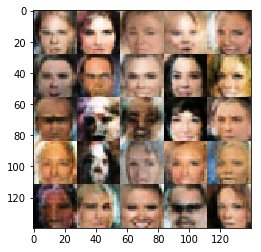

Epoch 2/5... Discriminator Loss: 0.7236... Generator Loss: 1.4712
Epoch 2/5... Discriminator Loss: 1.0798... Generator Loss: 0.7883
Epoch 2/5... Discriminator Loss: 1.1515... Generator Loss: 0.8808
Epoch 2/5... Discriminator Loss: 1.3335... Generator Loss: 0.9449
Epoch 2/5... Discriminator Loss: 0.8550... Generator Loss: 0.9956
Epoch 2/5... Discriminator Loss: 1.1708... Generator Loss: 1.1583
Epoch 2/5... Discriminator Loss: 0.8725... Generator Loss: 1.0460
Epoch 2/5... Discriminator Loss: 1.0809... Generator Loss: 1.5874
Epoch 2/5... Discriminator Loss: 1.0137... Generator Loss: 1.6039
Epoch 2/5... Discriminator Loss: 0.8021... Generator Loss: 1.3158


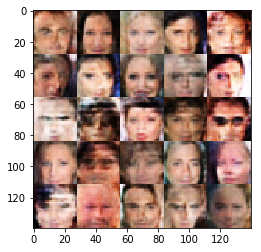

Epoch 2/5... Discriminator Loss: 1.1821... Generator Loss: 0.6422
Epoch 2/5... Discriminator Loss: 0.8503... Generator Loss: 1.0070
Epoch 2/5... Discriminator Loss: 0.6672... Generator Loss: 1.1400
Epoch 2/5... Discriminator Loss: 0.5849... Generator Loss: 1.2041
Epoch 2/5... Discriminator Loss: 1.0871... Generator Loss: 1.2883
Epoch 2/5... Discriminator Loss: 1.1048... Generator Loss: 0.7989
Epoch 2/5... Discriminator Loss: 0.8490... Generator Loss: 1.0970
Epoch 2/5... Discriminator Loss: 0.8390... Generator Loss: 1.6804
Epoch 2/5... Discriminator Loss: 1.0475... Generator Loss: 0.8955
Epoch 2/5... Discriminator Loss: 0.9502... Generator Loss: 0.8089


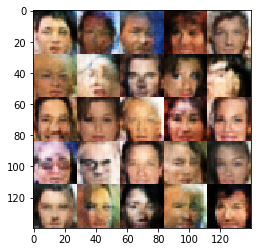

Epoch 2/5... Discriminator Loss: 0.8794... Generator Loss: 1.0913
Epoch 2/5... Discriminator Loss: 0.7573... Generator Loss: 1.3329
Epoch 2/5... Discriminator Loss: 0.8431... Generator Loss: 1.2909
Epoch 2/5... Discriminator Loss: 0.9202... Generator Loss: 0.9989
Epoch 2/5... Discriminator Loss: 0.7341... Generator Loss: 1.5240
Epoch 2/5... Discriminator Loss: 0.8566... Generator Loss: 0.9906
Epoch 2/5... Discriminator Loss: 1.0980... Generator Loss: 0.5768
Epoch 2/5... Discriminator Loss: 0.9940... Generator Loss: 0.6887
Epoch 2/5... Discriminator Loss: 0.9656... Generator Loss: 1.1529
Epoch 2/5... Discriminator Loss: 1.0169... Generator Loss: 0.8069


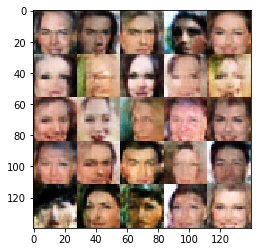

Epoch 2/5... Discriminator Loss: 1.2006... Generator Loss: 0.6442
Epoch 2/5... Discriminator Loss: 1.0934... Generator Loss: 0.8657
Epoch 2/5... Discriminator Loss: 0.9683... Generator Loss: 0.8681
Epoch 2/5... Discriminator Loss: 0.9815... Generator Loss: 1.2968
Epoch 2/5... Discriminator Loss: 0.8006... Generator Loss: 1.3636
Epoch 2/5... Discriminator Loss: 1.2458... Generator Loss: 1.4641
Epoch 2/5... Discriminator Loss: 1.2206... Generator Loss: 0.5706
Epoch 2/5... Discriminator Loss: 1.3994... Generator Loss: 0.3974
Epoch 2/5... Discriminator Loss: 1.0407... Generator Loss: 0.7962
Epoch 2/5... Discriminator Loss: 0.8844... Generator Loss: 0.8986


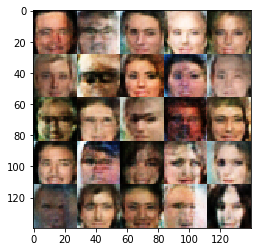

Epoch 2/5... Discriminator Loss: 1.0254... Generator Loss: 1.2260
Epoch 2/5... Discriminator Loss: 1.2085... Generator Loss: 0.6950
Epoch 2/5... Discriminator Loss: 1.0520... Generator Loss: 0.6768
Epoch 2/5... Discriminator Loss: 0.9009... Generator Loss: 1.2808
Epoch 2/5... Discriminator Loss: 0.9125... Generator Loss: 0.9088
Epoch 2/5... Discriminator Loss: 0.9663... Generator Loss: 0.9680
Epoch 2/5... Discriminator Loss: 0.8532... Generator Loss: 0.8897
Epoch 2/5... Discriminator Loss: 0.9976... Generator Loss: 0.9246
Epoch 2/5... Discriminator Loss: 0.7355... Generator Loss: 1.1472
Epoch 2/5... Discriminator Loss: 1.1842... Generator Loss: 1.7440


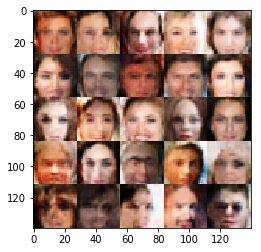

Epoch 2/5... Discriminator Loss: 0.8588... Generator Loss: 1.0610
Epoch 2/5... Discriminator Loss: 1.0237... Generator Loss: 0.8166
Epoch 2/5... Discriminator Loss: 1.0013... Generator Loss: 1.5303
Epoch 2/5... Discriminator Loss: 0.7812... Generator Loss: 1.5339
Epoch 2/5... Discriminator Loss: 1.0259... Generator Loss: 0.6895
Epoch 2/5... Discriminator Loss: 0.8634... Generator Loss: 1.5712
Epoch 2/5... Discriminator Loss: 1.2523... Generator Loss: 0.5734
Epoch 2/5... Discriminator Loss: 1.1357... Generator Loss: 0.7061
Epoch 2/5... Discriminator Loss: 0.9259... Generator Loss: 1.0056
Epoch 2/5... Discriminator Loss: 0.8264... Generator Loss: 1.3735


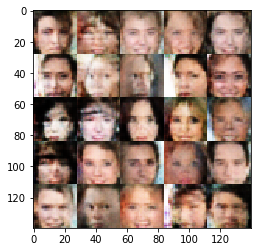

Epoch 2/5... Discriminator Loss: 0.8375... Generator Loss: 1.3366
Epoch 2/5... Discriminator Loss: 0.8733... Generator Loss: 1.1604
Epoch 2/5... Discriminator Loss: 0.8646... Generator Loss: 0.8188
Epoch 2/5... Discriminator Loss: 0.9862... Generator Loss: 1.1741
Epoch 2/5... Discriminator Loss: 1.1300... Generator Loss: 0.6791
Epoch 2/5... Discriminator Loss: 0.8481... Generator Loss: 1.1058
Epoch 2/5... Discriminator Loss: 0.9138... Generator Loss: 1.0946
Epoch 2/5... Discriminator Loss: 0.7637... Generator Loss: 1.2714
Epoch 2/5... Discriminator Loss: 0.6298... Generator Loss: 1.6306
Epoch 2/5... Discriminator Loss: 0.8365... Generator Loss: 1.1954


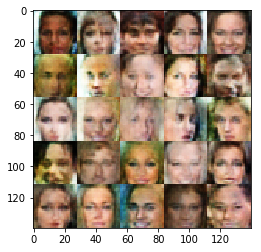

Epoch 2/5... Discriminator Loss: 1.0608... Generator Loss: 1.0264
Epoch 2/5... Discriminator Loss: 1.0987... Generator Loss: 0.7317
Epoch 2/5... Discriminator Loss: 0.9887... Generator Loss: 1.2339
Epoch 2/5... Discriminator Loss: 0.8592... Generator Loss: 1.4335
Epoch 2/5... Discriminator Loss: 1.4068... Generator Loss: 0.4376
Epoch 2/5... Discriminator Loss: 1.0909... Generator Loss: 1.5281
Epoch 2/5... Discriminator Loss: 0.9995... Generator Loss: 0.7515
Epoch 2/5... Discriminator Loss: 0.9366... Generator Loss: 1.2441
Epoch 2/5... Discriminator Loss: 0.8221... Generator Loss: 0.9528
Epoch 2/5... Discriminator Loss: 1.1190... Generator Loss: 0.7014


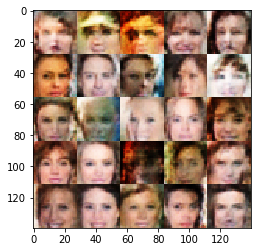

Epoch 2/5... Discriminator Loss: 0.9687... Generator Loss: 0.6866
Epoch 2/5... Discriminator Loss: 0.9490... Generator Loss: 0.8057
Epoch 2/5... Discriminator Loss: 0.9352... Generator Loss: 1.1804
Epoch 2/5... Discriminator Loss: 1.0878... Generator Loss: 0.6912
Epoch 2/5... Discriminator Loss: 0.5830... Generator Loss: 1.6442
Epoch 2/5... Discriminator Loss: 1.1195... Generator Loss: 1.8475
Epoch 2/5... Discriminator Loss: 1.0320... Generator Loss: 1.3075
Epoch 2/5... Discriminator Loss: 1.1310... Generator Loss: 1.4987
Epoch 2/5... Discriminator Loss: 0.8388... Generator Loss: 0.8840
Epoch 2/5... Discriminator Loss: 1.0797... Generator Loss: 0.6512


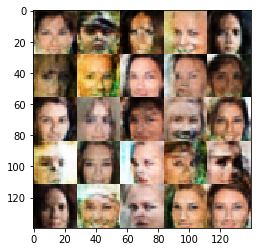

Epoch 2/5... Discriminator Loss: 0.8797... Generator Loss: 1.5898
Epoch 2/5... Discriminator Loss: 0.8370... Generator Loss: 0.9526
Epoch 2/5... Discriminator Loss: 0.9915... Generator Loss: 0.8972
Epoch 2/5... Discriminator Loss: 0.9824... Generator Loss: 0.7748
Epoch 2/5... Discriminator Loss: 1.1170... Generator Loss: 0.5875
Epoch 2/5... Discriminator Loss: 0.7834... Generator Loss: 1.2218
Epoch 2/5... Discriminator Loss: 0.9364... Generator Loss: 0.9590
Epoch 2/5... Discriminator Loss: 0.6783... Generator Loss: 1.2157
Epoch 2/5... Discriminator Loss: 0.8409... Generator Loss: 1.2867
Epoch 2/5... Discriminator Loss: 0.6683... Generator Loss: 1.4519


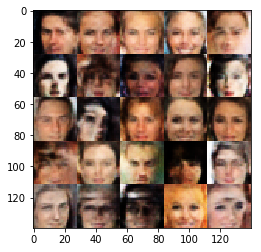

Epoch 2/5... Discriminator Loss: 1.0900... Generator Loss: 1.4199
Epoch 2/5... Discriminator Loss: 0.8846... Generator Loss: 1.0359
Epoch 2/5... Discriminator Loss: 1.1967... Generator Loss: 1.5607
Epoch 2/5... Discriminator Loss: 1.0934... Generator Loss: 0.7081
Epoch 2/5... Discriminator Loss: 0.7833... Generator Loss: 1.3723
Epoch 2/5... Discriminator Loss: 0.9524... Generator Loss: 0.7314
Epoch 2/5... Discriminator Loss: 1.2708... Generator Loss: 0.6782
Epoch 2/5... Discriminator Loss: 0.8824... Generator Loss: 0.8724
Epoch 2/5... Discriminator Loss: 0.7871... Generator Loss: 1.0212
Epoch 2/5... Discriminator Loss: 0.9718... Generator Loss: 1.1538


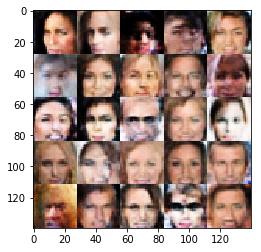

Epoch 2/5... Discriminator Loss: 1.0133... Generator Loss: 1.4443
Epoch 2/5... Discriminator Loss: 0.7979... Generator Loss: 1.4568
Epoch 2/5... Discriminator Loss: 1.0356... Generator Loss: 2.0081
Epoch 2/5... Discriminator Loss: 0.8616... Generator Loss: 1.3274
Epoch 2/5... Discriminator Loss: 1.0918... Generator Loss: 0.7794
Epoch 2/5... Discriminator Loss: 0.9329... Generator Loss: 1.1992
Epoch 2/5... Discriminator Loss: 0.8819... Generator Loss: 0.9763
Epoch 2/5... Discriminator Loss: 1.3780... Generator Loss: 0.4283
Epoch 2/5... Discriminator Loss: 1.0511... Generator Loss: 1.1120
Epoch 2/5... Discriminator Loss: 0.9011... Generator Loss: 1.1083


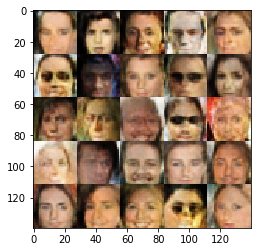

Epoch 2/5... Discriminator Loss: 0.9676... Generator Loss: 0.8197
Epoch 2/5... Discriminator Loss: 0.9039... Generator Loss: 1.0544
Epoch 2/5... Discriminator Loss: 1.4282... Generator Loss: 0.3853
Epoch 2/5... Discriminator Loss: 1.1031... Generator Loss: 1.5989
Epoch 2/5... Discriminator Loss: 0.8923... Generator Loss: 1.0692
Epoch 2/5... Discriminator Loss: 0.8358... Generator Loss: 0.9467
Epoch 2/5... Discriminator Loss: 1.2365... Generator Loss: 0.6764
Epoch 2/5... Discriminator Loss: 0.5142... Generator Loss: 1.7877
Epoch 2/5... Discriminator Loss: 1.1833... Generator Loss: 0.5406
Epoch 2/5... Discriminator Loss: 1.0548... Generator Loss: 0.6266


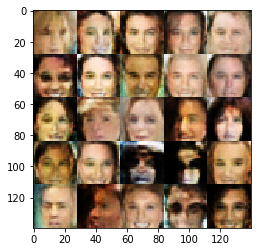

Epoch 2/5... Discriminator Loss: 0.8681... Generator Loss: 0.9489
Epoch 2/5... Discriminator Loss: 1.1708... Generator Loss: 0.6191
Epoch 2/5... Discriminator Loss: 1.0279... Generator Loss: 0.7295
Epoch 2/5... Discriminator Loss: 0.8371... Generator Loss: 1.2541
Epoch 2/5... Discriminator Loss: 1.0602... Generator Loss: 0.6636
Epoch 2/5... Discriminator Loss: 0.6609... Generator Loss: 1.6072
Epoch 2/5... Discriminator Loss: 1.0518... Generator Loss: 0.8159
Epoch 2/5... Discriminator Loss: 0.7737... Generator Loss: 1.0413
Epoch 2/5... Discriminator Loss: 0.8792... Generator Loss: 0.8550
Epoch 2/5... Discriminator Loss: 0.9407... Generator Loss: 0.8793


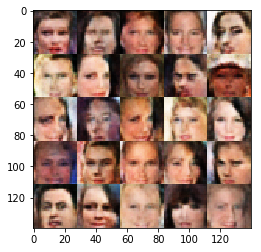

Epoch 2/5... Discriminator Loss: 1.0359... Generator Loss: 0.7194
Epoch 2/5... Discriminator Loss: 1.1956... Generator Loss: 0.5327
Epoch 2/5... Discriminator Loss: 1.1701... Generator Loss: 0.7043
Epoch 2/5... Discriminator Loss: 1.0925... Generator Loss: 0.6595
Epoch 2/5... Discriminator Loss: 1.0867... Generator Loss: 0.6005
Epoch 2/5... Discriminator Loss: 0.9777... Generator Loss: 1.0646
Epoch 2/5... Discriminator Loss: 0.6793... Generator Loss: 1.2398
Epoch 2/5... Discriminator Loss: 1.1664... Generator Loss: 0.5716
Epoch 2/5... Discriminator Loss: 1.0376... Generator Loss: 0.9713
Epoch 2/5... Discriminator Loss: 0.7215... Generator Loss: 1.4316


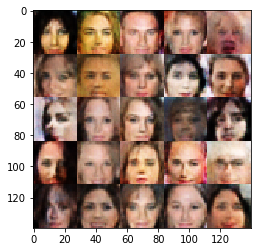

Epoch 2/5... Discriminator Loss: 0.7812... Generator Loss: 1.1210
Epoch 2/5... Discriminator Loss: 0.8063... Generator Loss: 1.3877
Epoch 2/5... Discriminator Loss: 1.0004... Generator Loss: 0.7422
Epoch 2/5... Discriminator Loss: 0.9296... Generator Loss: 0.8226
Epoch 2/5... Discriminator Loss: 0.8814... Generator Loss: 1.0449
Epoch 2/5... Discriminator Loss: 0.9671... Generator Loss: 1.1923
Epoch 2/5... Discriminator Loss: 1.1266... Generator Loss: 0.7270
Epoch 2/5... Discriminator Loss: 0.9343... Generator Loss: 0.9543
Epoch 2/5... Discriminator Loss: 0.8244... Generator Loss: 1.2086
Epoch 2/5... Discriminator Loss: 1.0274... Generator Loss: 0.6466


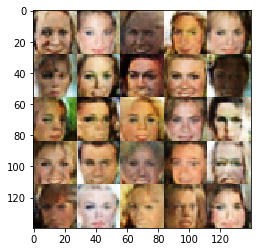

Epoch 2/5... Discriminator Loss: 0.7452... Generator Loss: 1.0628
Epoch 2/5... Discriminator Loss: 1.1941... Generator Loss: 0.5298
Epoch 2/5... Discriminator Loss: 0.8535... Generator Loss: 1.0119
Epoch 2/5... Discriminator Loss: 0.9008... Generator Loss: 1.3318
Epoch 2/5... Discriminator Loss: 0.8877... Generator Loss: 0.9231
Epoch 2/5... Discriminator Loss: 1.0076... Generator Loss: 0.8743
Epoch 2/5... Discriminator Loss: 0.9589... Generator Loss: 1.0068
Epoch 2/5... Discriminator Loss: 0.8422... Generator Loss: 1.1100
Epoch 2/5... Discriminator Loss: 1.5984... Generator Loss: 0.3120
Epoch 2/5... Discriminator Loss: 0.8221... Generator Loss: 1.3565


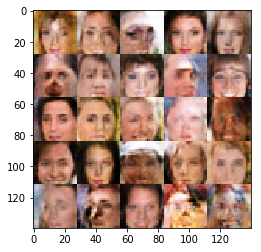

Epoch 2/5... Discriminator Loss: 0.8175... Generator Loss: 1.3193
Epoch 2/5... Discriminator Loss: 0.7273... Generator Loss: 1.1341
Epoch 2/5... Discriminator Loss: 0.9309... Generator Loss: 0.9502
Epoch 2/5... Discriminator Loss: 1.4786... Generator Loss: 0.3590
Epoch 2/5... Discriminator Loss: 1.2846... Generator Loss: 2.2198
Epoch 2/5... Discriminator Loss: 0.9760... Generator Loss: 1.2968
Epoch 2/5... Discriminator Loss: 0.8931... Generator Loss: 1.2596
Epoch 2/5... Discriminator Loss: 1.1231... Generator Loss: 0.6063
Epoch 2/5... Discriminator Loss: 1.2071... Generator Loss: 0.6910
Epoch 2/5... Discriminator Loss: 0.8283... Generator Loss: 0.9604


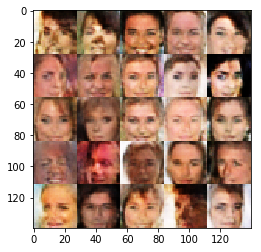

Epoch 2/5... Discriminator Loss: 0.9913... Generator Loss: 1.0103
Epoch 2/5... Discriminator Loss: 1.0919... Generator Loss: 0.6541
Epoch 2/5... Discriminator Loss: 0.8042... Generator Loss: 1.1395
Epoch 2/5... Discriminator Loss: 0.8864... Generator Loss: 0.8743
Epoch 2/5... Discriminator Loss: 1.0052... Generator Loss: 0.9131
Epoch 2/5... Discriminator Loss: 1.1044... Generator Loss: 0.8764
Epoch 2/5... Discriminator Loss: 0.9393... Generator Loss: 0.8381
Epoch 2/5... Discriminator Loss: 1.0456... Generator Loss: 1.1950
Epoch 2/5... Discriminator Loss: 1.2148... Generator Loss: 0.6064
Epoch 2/5... Discriminator Loss: 1.0280... Generator Loss: 0.7273


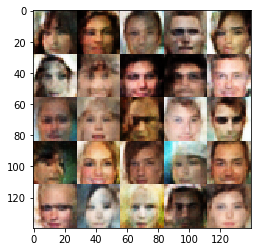

Epoch 2/5... Discriminator Loss: 0.8144... Generator Loss: 1.3172
Epoch 2/5... Discriminator Loss: 0.7404... Generator Loss: 1.1442
Epoch 2/5... Discriminator Loss: 0.8206... Generator Loss: 1.2097
Epoch 2/5... Discriminator Loss: 1.1300... Generator Loss: 0.5622
Epoch 2/5... Discriminator Loss: 0.9433... Generator Loss: 0.8109
Epoch 2/5... Discriminator Loss: 0.9535... Generator Loss: 0.8421
Epoch 2/5... Discriminator Loss: 1.2227... Generator Loss: 0.5591
Epoch 2/5... Discriminator Loss: 1.4002... Generator Loss: 0.5285
Epoch 2/5... Discriminator Loss: 1.0148... Generator Loss: 1.5646
Epoch 2/5... Discriminator Loss: 1.0363... Generator Loss: 0.6794


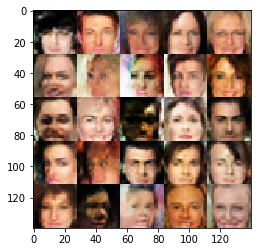

Epoch 2/5... Discriminator Loss: 0.8637... Generator Loss: 1.0503
Epoch 2/5... Discriminator Loss: 1.0635... Generator Loss: 0.8539
Epoch 2/5... Discriminator Loss: 1.1189... Generator Loss: 1.1363
Epoch 2/5... Discriminator Loss: 0.8542... Generator Loss: 0.8303
Epoch 2/5... Discriminator Loss: 0.8874... Generator Loss: 1.1501
Epoch 2/5... Discriminator Loss: 1.0953... Generator Loss: 0.7226
Epoch 2/5... Discriminator Loss: 0.9283... Generator Loss: 0.9223
Epoch 2/5... Discriminator Loss: 0.8565... Generator Loss: 0.9453
Epoch 2/5... Discriminator Loss: 0.7664... Generator Loss: 1.1766
Epoch 2/5... Discriminator Loss: 1.1654... Generator Loss: 0.5475


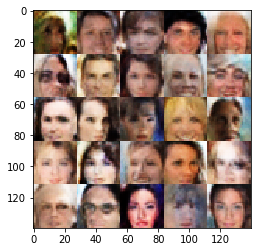

Epoch 2/5... Discriminator Loss: 0.9370... Generator Loss: 1.2310
Epoch 2/5... Discriminator Loss: 0.9888... Generator Loss: 1.3381
Epoch 2/5... Discriminator Loss: 1.0517... Generator Loss: 0.8765
Epoch 2/5... Discriminator Loss: 1.0368... Generator Loss: 0.6551
Epoch 2/5... Discriminator Loss: 0.8622... Generator Loss: 0.9748
Epoch 2/5... Discriminator Loss: 0.8909... Generator Loss: 0.8879
Epoch 2/5... Discriminator Loss: 1.0894... Generator Loss: 1.2184
Epoch 2/5... Discriminator Loss: 0.6787... Generator Loss: 1.8138
Epoch 2/5... Discriminator Loss: 0.9004... Generator Loss: 0.8848
Epoch 2/5... Discriminator Loss: 0.8960... Generator Loss: 1.3261


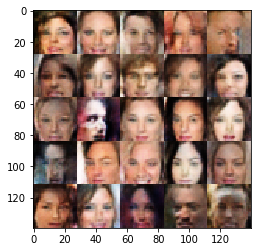

Epoch 2/5... Discriminator Loss: 1.1629... Generator Loss: 0.5794
Epoch 2/5... Discriminator Loss: 1.1057... Generator Loss: 0.6112
Epoch 2/5... Discriminator Loss: 0.8019... Generator Loss: 1.7934
Epoch 2/5... Discriminator Loss: 0.8713... Generator Loss: 1.3866
Epoch 2/5... Discriminator Loss: 0.9087... Generator Loss: 0.9039
Epoch 2/5... Discriminator Loss: 1.0254... Generator Loss: 0.6606
Epoch 2/5... Discriminator Loss: 1.0062... Generator Loss: 1.1382
Epoch 2/5... Discriminator Loss: 1.0269... Generator Loss: 1.5650
Epoch 2/5... Discriminator Loss: 0.8883... Generator Loss: 0.9101
Epoch 2/5... Discriminator Loss: 1.0492... Generator Loss: 0.9230


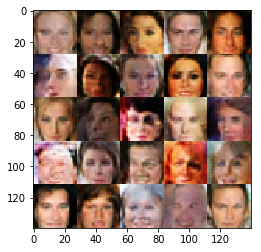

Epoch 2/5... Discriminator Loss: 1.0217... Generator Loss: 0.8874
Epoch 2/5... Discriminator Loss: 1.3467... Generator Loss: 0.4128
Epoch 2/5... Discriminator Loss: 0.8968... Generator Loss: 0.9298
Epoch 2/5... Discriminator Loss: 0.8710... Generator Loss: 0.9147
Epoch 2/5... Discriminator Loss: 0.8546... Generator Loss: 1.0426
Epoch 2/5... Discriminator Loss: 1.1263... Generator Loss: 0.8011
Epoch 2/5... Discriminator Loss: 0.8172... Generator Loss: 1.0929
Epoch 2/5... Discriminator Loss: 1.1552... Generator Loss: 1.3995
Epoch 2/5... Discriminator Loss: 1.1512... Generator Loss: 0.5681
Epoch 2/5... Discriminator Loss: 0.9478... Generator Loss: 1.0331


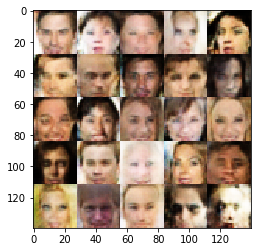

Epoch 2/5... Discriminator Loss: 0.8149... Generator Loss: 1.1362
Epoch 2/5... Discriminator Loss: 0.7912... Generator Loss: 1.1563
Epoch 2/5... Discriminator Loss: 0.8140... Generator Loss: 1.0566
Epoch 2/5... Discriminator Loss: 1.1544... Generator Loss: 0.6760
Epoch 2/5... Discriminator Loss: 1.3062... Generator Loss: 0.6814
Epoch 2/5... Discriminator Loss: 1.0272... Generator Loss: 1.1117
Epoch 2/5... Discriminator Loss: 0.9237... Generator Loss: 0.8651
Epoch 2/5... Discriminator Loss: 1.1065... Generator Loss: 0.6137
Epoch 2/5... Discriminator Loss: 0.7550... Generator Loss: 1.2632
Epoch 2/5... Discriminator Loss: 1.1456... Generator Loss: 0.6082


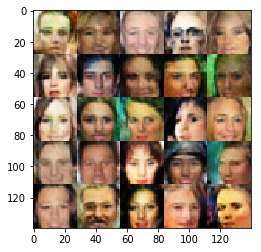

Epoch 2/5... Discriminator Loss: 0.9530... Generator Loss: 1.2988
Epoch 2/5... Discriminator Loss: 1.1418... Generator Loss: 1.2966
Epoch 2/5... Discriminator Loss: 1.1417... Generator Loss: 0.5572
Epoch 2/5... Discriminator Loss: 1.0222... Generator Loss: 0.6580
Epoch 2/5... Discriminator Loss: 1.0187... Generator Loss: 0.6317
Epoch 2/5... Discriminator Loss: 0.5962... Generator Loss: 1.5491
Epoch 2/5... Discriminator Loss: 0.9950... Generator Loss: 0.8145
Epoch 2/5... Discriminator Loss: 0.9155... Generator Loss: 0.9004
Epoch 2/5... Discriminator Loss: 0.9250... Generator Loss: 0.7740
Epoch 2/5... Discriminator Loss: 1.2589... Generator Loss: 0.5414


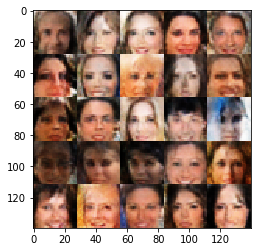

Epoch 2/5... Discriminator Loss: 0.9379... Generator Loss: 0.9590
Epoch 2/5... Discriminator Loss: 1.1575... Generator Loss: 0.7341
Epoch 2/5... Discriminator Loss: 0.8406... Generator Loss: 1.2540
Epoch 2/5... Discriminator Loss: 1.1111... Generator Loss: 1.2209
Epoch 2/5... Discriminator Loss: 0.9071... Generator Loss: 1.1062
Epoch 2/5... Discriminator Loss: 0.9505... Generator Loss: 0.9581
Epoch 2/5... Discriminator Loss: 0.9794... Generator Loss: 1.2189
Epoch 2/5... Discriminator Loss: 1.0835... Generator Loss: 0.6179
Epoch 2/5... Discriminator Loss: 0.8074... Generator Loss: 1.7499
Epoch 2/5... Discriminator Loss: 1.1646... Generator Loss: 0.7710


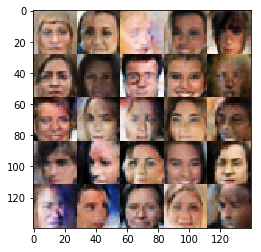

Epoch 2/5... Discriminator Loss: 1.0978... Generator Loss: 0.7019
Epoch 2/5... Discriminator Loss: 0.9626... Generator Loss: 0.7042
Epoch 2/5... Discriminator Loss: 1.1304... Generator Loss: 0.6838
Epoch 2/5... Discriminator Loss: 0.8329... Generator Loss: 1.1013
Epoch 2/5... Discriminator Loss: 1.0237... Generator Loss: 0.7951
Epoch 2/5... Discriminator Loss: 1.3463... Generator Loss: 0.4443
Epoch 2/5... Discriminator Loss: 1.0569... Generator Loss: 0.7451
Epoch 2/5... Discriminator Loss: 0.9077... Generator Loss: 1.3275
Epoch 2/5... Discriminator Loss: 1.4197... Generator Loss: 0.4165
Epoch 2/5... Discriminator Loss: 0.8804... Generator Loss: 1.1115


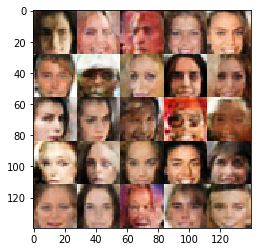

Epoch 2/5... Discriminator Loss: 0.8638... Generator Loss: 1.1932
Epoch 2/5... Discriminator Loss: 0.7953... Generator Loss: 1.3426
Epoch 2/5... Discriminator Loss: 1.1435... Generator Loss: 1.1216
Epoch 2/5... Discriminator Loss: 0.9313... Generator Loss: 0.9712
Epoch 2/5... Discriminator Loss: 0.8670... Generator Loss: 0.9930
Epoch 2/5... Discriminator Loss: 1.0595... Generator Loss: 0.6714
Epoch 2/5... Discriminator Loss: 0.7350... Generator Loss: 1.2654
Epoch 2/5... Discriminator Loss: 1.1488... Generator Loss: 0.6710
Epoch 2/5... Discriminator Loss: 1.0778... Generator Loss: 0.7080
Epoch 2/5... Discriminator Loss: 0.8392... Generator Loss: 1.1646


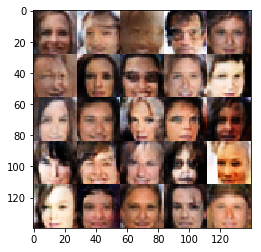

Epoch 2/5... Discriminator Loss: 0.8410... Generator Loss: 1.1338
Epoch 2/5... Discriminator Loss: 1.2075... Generator Loss: 0.7630
Epoch 2/5... Discriminator Loss: 1.0518... Generator Loss: 1.1885
Epoch 3/5... Discriminator Loss: 0.6747... Generator Loss: 1.4655
Epoch 3/5... Discriminator Loss: 1.5282... Generator Loss: 0.4562
Epoch 3/5... Discriminator Loss: 1.0960... Generator Loss: 1.0364
Epoch 3/5... Discriminator Loss: 1.1481... Generator Loss: 1.3433
Epoch 3/5... Discriminator Loss: 1.0724... Generator Loss: 0.7365
Epoch 3/5... Discriminator Loss: 0.9156... Generator Loss: 0.7606
Epoch 3/5... Discriminator Loss: 1.2875... Generator Loss: 0.5004


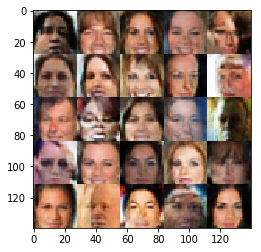

Epoch 3/5... Discriminator Loss: 0.9394... Generator Loss: 0.8256
Epoch 3/5... Discriminator Loss: 0.7852... Generator Loss: 1.2477
Epoch 3/5... Discriminator Loss: 1.0260... Generator Loss: 0.8027
Epoch 3/5... Discriminator Loss: 1.1711... Generator Loss: 0.5477
Epoch 3/5... Discriminator Loss: 0.9240... Generator Loss: 0.7734
Epoch 3/5... Discriminator Loss: 0.8801... Generator Loss: 0.8370
Epoch 3/5... Discriminator Loss: 1.3422... Generator Loss: 0.4045
Epoch 3/5... Discriminator Loss: 1.0826... Generator Loss: 1.3232
Epoch 3/5... Discriminator Loss: 1.4594... Generator Loss: 0.5779
Epoch 3/5... Discriminator Loss: 0.9771... Generator Loss: 1.1732


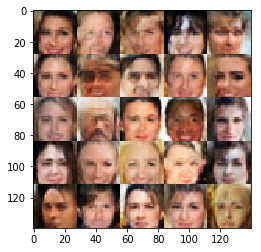

Epoch 3/5... Discriminator Loss: 0.9084... Generator Loss: 0.9356
Epoch 3/5... Discriminator Loss: 0.9274... Generator Loss: 1.0432
Epoch 3/5... Discriminator Loss: 0.9525... Generator Loss: 0.8558
Epoch 3/5... Discriminator Loss: 1.2859... Generator Loss: 0.5042
Epoch 3/5... Discriminator Loss: 0.7995... Generator Loss: 1.2380
Epoch 3/5... Discriminator Loss: 1.0389... Generator Loss: 0.7676
Epoch 3/5... Discriminator Loss: 0.8122... Generator Loss: 1.1750
Epoch 3/5... Discriminator Loss: 0.9622... Generator Loss: 1.2766
Epoch 3/5... Discriminator Loss: 0.8846... Generator Loss: 0.9414
Epoch 3/5... Discriminator Loss: 0.9464... Generator Loss: 1.0853


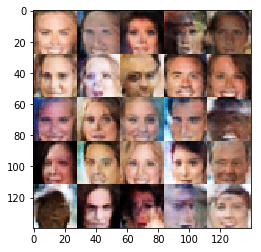

Epoch 3/5... Discriminator Loss: 1.1031... Generator Loss: 0.7539
Epoch 3/5... Discriminator Loss: 1.1397... Generator Loss: 0.5726
Epoch 3/5... Discriminator Loss: 1.3038... Generator Loss: 0.5394
Epoch 3/5... Discriminator Loss: 0.7978... Generator Loss: 1.0813
Epoch 3/5... Discriminator Loss: 0.8986... Generator Loss: 0.8903
Epoch 3/5... Discriminator Loss: 0.7827... Generator Loss: 1.0412
Epoch 3/5... Discriminator Loss: 1.0572... Generator Loss: 1.1431
Epoch 3/5... Discriminator Loss: 0.8844... Generator Loss: 0.9219
Epoch 3/5... Discriminator Loss: 0.8604... Generator Loss: 1.2641
Epoch 3/5... Discriminator Loss: 1.0915... Generator Loss: 0.6896


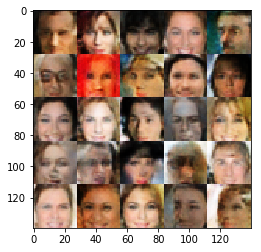

Epoch 3/5... Discriminator Loss: 0.9114... Generator Loss: 1.1507
Epoch 3/5... Discriminator Loss: 0.8064... Generator Loss: 1.0082
Epoch 3/5... Discriminator Loss: 0.9843... Generator Loss: 0.7651
Epoch 3/5... Discriminator Loss: 0.8943... Generator Loss: 1.1213
Epoch 3/5... Discriminator Loss: 1.2266... Generator Loss: 0.5048
Epoch 3/5... Discriminator Loss: 1.1167... Generator Loss: 0.6802
Epoch 3/5... Discriminator Loss: 0.7377... Generator Loss: 1.1342
Epoch 3/5... Discriminator Loss: 0.8485... Generator Loss: 0.9701
Epoch 3/5... Discriminator Loss: 1.1842... Generator Loss: 0.5410
Epoch 3/5... Discriminator Loss: 1.2052... Generator Loss: 1.0037


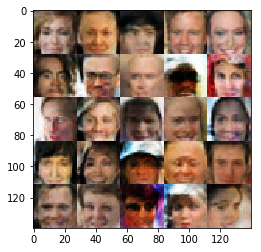

Epoch 3/5... Discriminator Loss: 0.7426... Generator Loss: 1.6095
Epoch 3/5... Discriminator Loss: 1.0896... Generator Loss: 0.7325
Epoch 3/5... Discriminator Loss: 0.9858... Generator Loss: 1.0244
Epoch 3/5... Discriminator Loss: 1.3837... Generator Loss: 0.4616
Epoch 3/5... Discriminator Loss: 1.0376... Generator Loss: 1.2916
Epoch 3/5... Discriminator Loss: 0.7009... Generator Loss: 1.1047
Epoch 3/5... Discriminator Loss: 0.8790... Generator Loss: 1.2135
Epoch 3/5... Discriminator Loss: 1.0747... Generator Loss: 0.6553
Epoch 3/5... Discriminator Loss: 0.9793... Generator Loss: 0.6771
Epoch 3/5... Discriminator Loss: 0.8249... Generator Loss: 1.0343


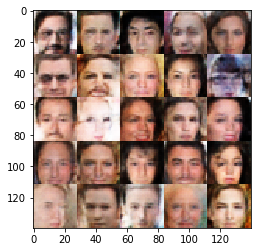

Epoch 3/5... Discriminator Loss: 0.9315... Generator Loss: 1.1742
Epoch 3/5... Discriminator Loss: 1.0351... Generator Loss: 0.9269
Epoch 3/5... Discriminator Loss: 0.9185... Generator Loss: 0.7037
Epoch 3/5... Discriminator Loss: 0.9128... Generator Loss: 1.3948
Epoch 3/5... Discriminator Loss: 0.9906... Generator Loss: 0.7097
Epoch 3/5... Discriminator Loss: 0.8204... Generator Loss: 1.2712
Epoch 3/5... Discriminator Loss: 0.9677... Generator Loss: 1.5308
Epoch 3/5... Discriminator Loss: 1.2851... Generator Loss: 0.5140
Epoch 3/5... Discriminator Loss: 1.3842... Generator Loss: 0.3996
Epoch 3/5... Discriminator Loss: 1.1056... Generator Loss: 0.7379


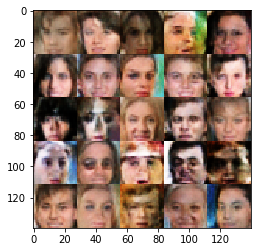

Epoch 3/5... Discriminator Loss: 1.0830... Generator Loss: 0.7078
Epoch 3/5... Discriminator Loss: 0.8309... Generator Loss: 1.2827
Epoch 3/5... Discriminator Loss: 1.1623... Generator Loss: 0.8110
Epoch 3/5... Discriminator Loss: 1.1920... Generator Loss: 0.6050
Epoch 3/5... Discriminator Loss: 1.0461... Generator Loss: 0.7136
Epoch 3/5... Discriminator Loss: 0.9065... Generator Loss: 1.1078
Epoch 3/5... Discriminator Loss: 0.9431... Generator Loss: 0.7239
Epoch 3/5... Discriminator Loss: 0.9788... Generator Loss: 0.8187
Epoch 3/5... Discriminator Loss: 1.1197... Generator Loss: 0.6172
Epoch 3/5... Discriminator Loss: 0.9591... Generator Loss: 0.7944


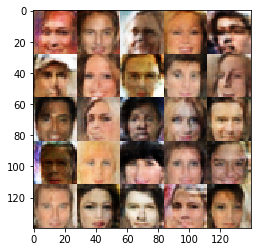

Epoch 3/5... Discriminator Loss: 0.7927... Generator Loss: 1.1102
Epoch 3/5... Discriminator Loss: 0.9193... Generator Loss: 0.9520
Epoch 3/5... Discriminator Loss: 0.8750... Generator Loss: 0.9158
Epoch 3/5... Discriminator Loss: 1.1956... Generator Loss: 0.6746
Epoch 3/5... Discriminator Loss: 0.8188... Generator Loss: 1.1829
Epoch 3/5... Discriminator Loss: 1.0728... Generator Loss: 0.8777
Epoch 3/5... Discriminator Loss: 0.7773... Generator Loss: 1.1604
Epoch 3/5... Discriminator Loss: 0.9327... Generator Loss: 1.6346
Epoch 3/5... Discriminator Loss: 0.9728... Generator Loss: 0.8699
Epoch 3/5... Discriminator Loss: 0.8173... Generator Loss: 1.1521


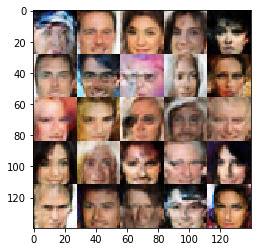

Epoch 3/5... Discriminator Loss: 1.0765... Generator Loss: 0.7755
Epoch 3/5... Discriminator Loss: 1.4081... Generator Loss: 0.3756
Epoch 3/5... Discriminator Loss: 0.6121... Generator Loss: 1.2070
Epoch 3/5... Discriminator Loss: 1.0440... Generator Loss: 0.7360
Epoch 3/5... Discriminator Loss: 0.9528... Generator Loss: 1.0451
Epoch 3/5... Discriminator Loss: 0.8061... Generator Loss: 0.9149
Epoch 3/5... Discriminator Loss: 0.9914... Generator Loss: 0.8077
Epoch 3/5... Discriminator Loss: 0.9745... Generator Loss: 0.7411
Epoch 3/5... Discriminator Loss: 1.3732... Generator Loss: 0.4517
Epoch 3/5... Discriminator Loss: 1.1590... Generator Loss: 0.6569


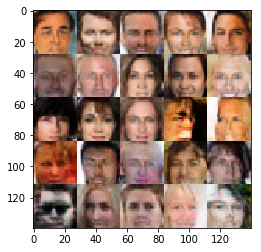

Epoch 3/5... Discriminator Loss: 0.8023... Generator Loss: 1.3897
Epoch 3/5... Discriminator Loss: 1.0695... Generator Loss: 0.7403
Epoch 3/5... Discriminator Loss: 1.0246... Generator Loss: 0.8184
Epoch 3/5... Discriminator Loss: 1.1594... Generator Loss: 0.6296
Epoch 3/5... Discriminator Loss: 0.9287... Generator Loss: 0.8201
Epoch 3/5... Discriminator Loss: 0.8649... Generator Loss: 1.1480
Epoch 3/5... Discriminator Loss: 0.8805... Generator Loss: 1.1566
Epoch 3/5... Discriminator Loss: 1.1607... Generator Loss: 0.7260
Epoch 3/5... Discriminator Loss: 0.7391... Generator Loss: 1.2465
Epoch 3/5... Discriminator Loss: 1.2120... Generator Loss: 0.7131


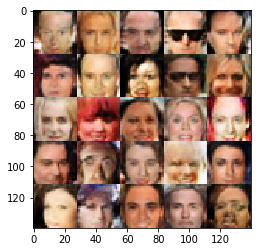

Epoch 3/5... Discriminator Loss: 0.8449... Generator Loss: 1.0930
Epoch 3/5... Discriminator Loss: 0.6558... Generator Loss: 1.4247
Epoch 3/5... Discriminator Loss: 0.8195... Generator Loss: 0.8418
Epoch 3/5... Discriminator Loss: 1.1903... Generator Loss: 1.2955
Epoch 3/5... Discriminator Loss: 0.9418... Generator Loss: 0.9274
Epoch 3/5... Discriminator Loss: 0.8951... Generator Loss: 1.2217
Epoch 3/5... Discriminator Loss: 1.0587... Generator Loss: 0.7293
Epoch 3/5... Discriminator Loss: 1.0481... Generator Loss: 0.6738
Epoch 3/5... Discriminator Loss: 1.1628... Generator Loss: 0.5541
Epoch 3/5... Discriminator Loss: 0.9213... Generator Loss: 0.8424


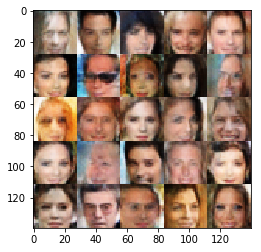

Epoch 3/5... Discriminator Loss: 0.8908... Generator Loss: 1.1083
Epoch 3/5... Discriminator Loss: 1.1150... Generator Loss: 0.7030
Epoch 3/5... Discriminator Loss: 0.8757... Generator Loss: 1.2232
Epoch 3/5... Discriminator Loss: 1.3695... Generator Loss: 0.4691
Epoch 3/5... Discriminator Loss: 1.0617... Generator Loss: 1.1180
Epoch 3/5... Discriminator Loss: 0.7955... Generator Loss: 1.0778
Epoch 3/5... Discriminator Loss: 1.0810... Generator Loss: 0.8275
Epoch 3/5... Discriminator Loss: 0.8659... Generator Loss: 0.9024
Epoch 3/5... Discriminator Loss: 1.0437... Generator Loss: 0.9639
Epoch 3/5... Discriminator Loss: 1.1480... Generator Loss: 0.6104


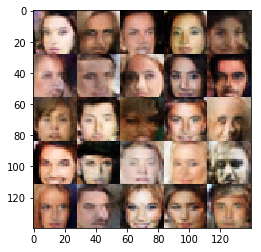

Epoch 3/5... Discriminator Loss: 1.0207... Generator Loss: 0.8717
Epoch 3/5... Discriminator Loss: 1.1225... Generator Loss: 0.6836
Epoch 3/5... Discriminator Loss: 1.0823... Generator Loss: 0.6736
Epoch 3/5... Discriminator Loss: 0.8595... Generator Loss: 0.9477
Epoch 3/5... Discriminator Loss: 1.3649... Generator Loss: 0.4380
Epoch 3/5... Discriminator Loss: 0.8281... Generator Loss: 1.1422
Epoch 3/5... Discriminator Loss: 1.1007... Generator Loss: 0.6170
Epoch 3/5... Discriminator Loss: 0.9063... Generator Loss: 1.3223
Epoch 3/5... Discriminator Loss: 1.0280... Generator Loss: 0.8715
Epoch 3/5... Discriminator Loss: 0.8944... Generator Loss: 0.8103


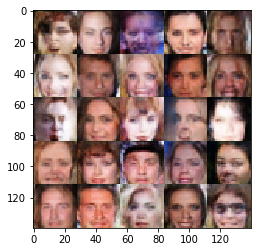

Epoch 3/5... Discriminator Loss: 1.0988... Generator Loss: 0.6188
Epoch 3/5... Discriminator Loss: 0.8510... Generator Loss: 0.9495
Epoch 3/5... Discriminator Loss: 0.8931... Generator Loss: 0.8449
Epoch 3/5... Discriminator Loss: 0.9276... Generator Loss: 0.8656
Epoch 3/5... Discriminator Loss: 0.6378... Generator Loss: 1.4267
Epoch 3/5... Discriminator Loss: 1.5426... Generator Loss: 0.4022
Epoch 3/5... Discriminator Loss: 1.2645... Generator Loss: 0.5595
Epoch 3/5... Discriminator Loss: 0.9816... Generator Loss: 0.7005
Epoch 3/5... Discriminator Loss: 0.9808... Generator Loss: 0.8099
Epoch 3/5... Discriminator Loss: 0.7107... Generator Loss: 1.3526


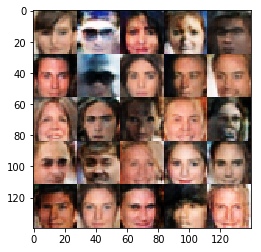

Epoch 3/5... Discriminator Loss: 0.9210... Generator Loss: 0.7971
Epoch 3/5... Discriminator Loss: 1.1012... Generator Loss: 0.7828
Epoch 3/5... Discriminator Loss: 1.1534... Generator Loss: 0.5645
Epoch 3/5... Discriminator Loss: 1.0793... Generator Loss: 0.7134
Epoch 3/5... Discriminator Loss: 1.0746... Generator Loss: 0.7052
Epoch 3/5... Discriminator Loss: 0.9895... Generator Loss: 0.9812
Epoch 3/5... Discriminator Loss: 0.8165... Generator Loss: 1.4402
Epoch 3/5... Discriminator Loss: 1.0097... Generator Loss: 0.9199
Epoch 3/5... Discriminator Loss: 0.8848... Generator Loss: 1.3777
Epoch 3/5... Discriminator Loss: 0.7413... Generator Loss: 1.4525


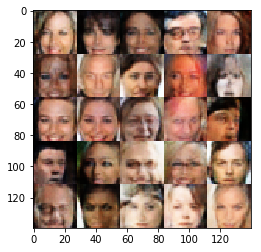

Epoch 3/5... Discriminator Loss: 1.2322... Generator Loss: 0.5291
Epoch 3/5... Discriminator Loss: 1.2404... Generator Loss: 0.5882
Epoch 3/5... Discriminator Loss: 0.8905... Generator Loss: 1.2503
Epoch 3/5... Discriminator Loss: 0.7083... Generator Loss: 1.3552
Epoch 3/5... Discriminator Loss: 0.8794... Generator Loss: 0.9455
Epoch 3/5... Discriminator Loss: 1.2271... Generator Loss: 1.0359
Epoch 3/5... Discriminator Loss: 0.9135... Generator Loss: 1.8252
Epoch 3/5... Discriminator Loss: 1.1079... Generator Loss: 0.6824
Epoch 3/5... Discriminator Loss: 1.0010... Generator Loss: 0.6234
Epoch 3/5... Discriminator Loss: 0.8822... Generator Loss: 0.9788


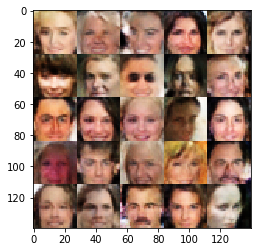

Epoch 3/5... Discriminator Loss: 0.4783... Generator Loss: 1.8869
Epoch 3/5... Discriminator Loss: 0.8880... Generator Loss: 0.8472
Epoch 3/5... Discriminator Loss: 0.7203... Generator Loss: 1.2865
Epoch 3/5... Discriminator Loss: 1.3573... Generator Loss: 0.4109
Epoch 3/5... Discriminator Loss: 1.0543... Generator Loss: 0.9169
Epoch 3/5... Discriminator Loss: 1.1845... Generator Loss: 0.6301
Epoch 3/5... Discriminator Loss: 0.9197... Generator Loss: 0.8844
Epoch 3/5... Discriminator Loss: 1.0930... Generator Loss: 0.6257
Epoch 3/5... Discriminator Loss: 1.2442... Generator Loss: 0.5331
Epoch 3/5... Discriminator Loss: 0.9144... Generator Loss: 1.2019


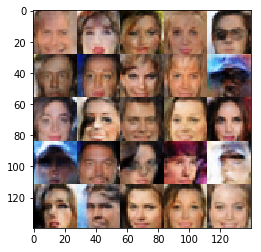

Epoch 3/5... Discriminator Loss: 0.8943... Generator Loss: 0.8545
Epoch 3/5... Discriminator Loss: 0.8924... Generator Loss: 0.8628
Epoch 3/5... Discriminator Loss: 1.2396... Generator Loss: 0.5612
Epoch 3/5... Discriminator Loss: 1.0759... Generator Loss: 0.8067
Epoch 3/5... Discriminator Loss: 0.8197... Generator Loss: 0.9832
Epoch 3/5... Discriminator Loss: 1.0874... Generator Loss: 1.0347
Epoch 3/5... Discriminator Loss: 0.8650... Generator Loss: 1.1434
Epoch 3/5... Discriminator Loss: 0.8970... Generator Loss: 1.1849
Epoch 3/5... Discriminator Loss: 0.9647... Generator Loss: 1.4036
Epoch 3/5... Discriminator Loss: 1.0150... Generator Loss: 0.8062


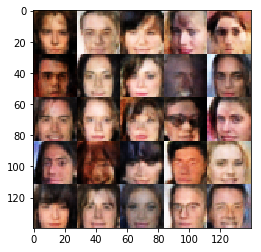

Epoch 3/5... Discriminator Loss: 1.1916... Generator Loss: 0.5876
Epoch 3/5... Discriminator Loss: 0.8223... Generator Loss: 1.4956
Epoch 3/5... Discriminator Loss: 0.8936... Generator Loss: 1.5487
Epoch 3/5... Discriminator Loss: 1.0418... Generator Loss: 0.6354
Epoch 3/5... Discriminator Loss: 0.9945... Generator Loss: 1.2837
Epoch 3/5... Discriminator Loss: 0.8812... Generator Loss: 1.2584
Epoch 3/5... Discriminator Loss: 1.0332... Generator Loss: 0.6769
Epoch 3/5... Discriminator Loss: 0.9634... Generator Loss: 0.8167
Epoch 3/5... Discriminator Loss: 1.0789... Generator Loss: 0.6703
Epoch 3/5... Discriminator Loss: 0.9878... Generator Loss: 1.2111


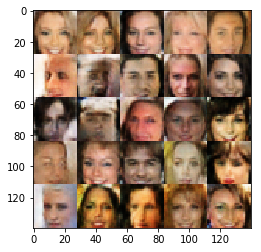

Epoch 3/5... Discriminator Loss: 0.8045... Generator Loss: 1.2509
Epoch 3/5... Discriminator Loss: 0.7253... Generator Loss: 1.1459
Epoch 3/5... Discriminator Loss: 1.2164... Generator Loss: 0.5276
Epoch 3/5... Discriminator Loss: 1.0727... Generator Loss: 0.6122
Epoch 3/5... Discriminator Loss: 1.0025... Generator Loss: 0.7219
Epoch 3/5... Discriminator Loss: 0.9009... Generator Loss: 0.8777
Epoch 3/5... Discriminator Loss: 0.9639... Generator Loss: 0.7737
Epoch 3/5... Discriminator Loss: 0.8057... Generator Loss: 1.0283
Epoch 3/5... Discriminator Loss: 0.9544... Generator Loss: 0.8080
Epoch 3/5... Discriminator Loss: 1.2000... Generator Loss: 0.5220


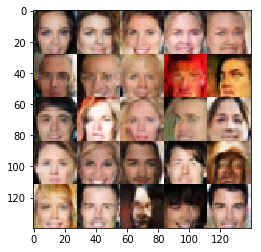

Epoch 3/5... Discriminator Loss: 0.7874... Generator Loss: 1.3272
Epoch 3/5... Discriminator Loss: 1.2326... Generator Loss: 0.5647
Epoch 3/5... Discriminator Loss: 0.9913... Generator Loss: 1.4515
Epoch 3/5... Discriminator Loss: 0.9949... Generator Loss: 0.7285
Epoch 3/5... Discriminator Loss: 1.2859... Generator Loss: 0.4695
Epoch 3/5... Discriminator Loss: 1.1686... Generator Loss: 0.5546
Epoch 3/5... Discriminator Loss: 0.9165... Generator Loss: 1.2976
Epoch 3/5... Discriminator Loss: 1.1833... Generator Loss: 1.0348
Epoch 3/5... Discriminator Loss: 0.7717... Generator Loss: 1.2694
Epoch 3/5... Discriminator Loss: 0.9988... Generator Loss: 0.6672


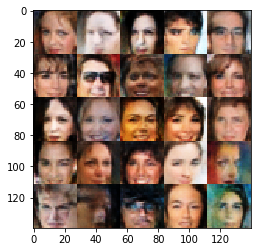

Epoch 3/5... Discriminator Loss: 0.9974... Generator Loss: 0.8033
Epoch 3/5... Discriminator Loss: 0.7746... Generator Loss: 0.9397
Epoch 3/5... Discriminator Loss: 1.0079... Generator Loss: 1.8848
Epoch 3/5... Discriminator Loss: 1.1574... Generator Loss: 0.8408
Epoch 3/5... Discriminator Loss: 0.5188... Generator Loss: 1.6191
Epoch 3/5... Discriminator Loss: 0.9659... Generator Loss: 1.0455
Epoch 3/5... Discriminator Loss: 1.4652... Generator Loss: 0.3638
Epoch 3/5... Discriminator Loss: 0.8579... Generator Loss: 0.7943
Epoch 3/5... Discriminator Loss: 0.8860... Generator Loss: 1.2844
Epoch 3/5... Discriminator Loss: 0.9217... Generator Loss: 0.9065


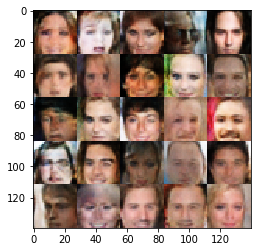

Epoch 3/5... Discriminator Loss: 0.9961... Generator Loss: 1.2201
Epoch 3/5... Discriminator Loss: 0.8812... Generator Loss: 0.9594
Epoch 3/5... Discriminator Loss: 1.2839... Generator Loss: 0.5182
Epoch 3/5... Discriminator Loss: 0.8877... Generator Loss: 0.9597
Epoch 3/5... Discriminator Loss: 0.9346... Generator Loss: 1.4280
Epoch 3/5... Discriminator Loss: 1.3937... Generator Loss: 0.4111
Epoch 3/5... Discriminator Loss: 1.1014... Generator Loss: 0.9045
Epoch 3/5... Discriminator Loss: 0.9372... Generator Loss: 0.8506
Epoch 3/5... Discriminator Loss: 1.0668... Generator Loss: 0.6937
Epoch 3/5... Discriminator Loss: 1.3747... Generator Loss: 0.3852


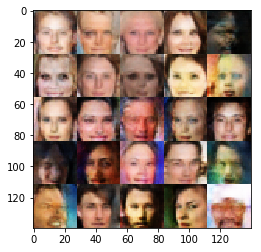

Epoch 3/5... Discriminator Loss: 0.9113... Generator Loss: 1.0277
Epoch 3/5... Discriminator Loss: 0.9906... Generator Loss: 0.8734
Epoch 3/5... Discriminator Loss: 1.2851... Generator Loss: 1.0286
Epoch 3/5... Discriminator Loss: 0.9798... Generator Loss: 0.8652
Epoch 3/5... Discriminator Loss: 1.1954... Generator Loss: 0.5708
Epoch 3/5... Discriminator Loss: 1.1435... Generator Loss: 0.6379
Epoch 3/5... Discriminator Loss: 1.0890... Generator Loss: 0.7642
Epoch 3/5... Discriminator Loss: 0.8274... Generator Loss: 1.0525
Epoch 3/5... Discriminator Loss: 0.8452... Generator Loss: 0.9415
Epoch 3/5... Discriminator Loss: 1.1887... Generator Loss: 0.6605


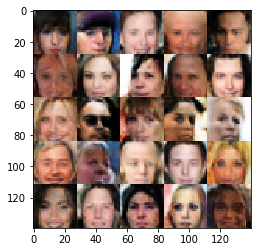

Epoch 3/5... Discriminator Loss: 0.8553... Generator Loss: 1.5120
Epoch 3/5... Discriminator Loss: 1.1557... Generator Loss: 1.6078
Epoch 3/5... Discriminator Loss: 0.9073... Generator Loss: 0.8122
Epoch 3/5... Discriminator Loss: 0.8683... Generator Loss: 1.0564
Epoch 3/5... Discriminator Loss: 1.1707... Generator Loss: 0.7563
Epoch 3/5... Discriminator Loss: 0.8474... Generator Loss: 1.1504
Epoch 3/5... Discriminator Loss: 1.1791... Generator Loss: 0.7426
Epoch 3/5... Discriminator Loss: 1.0522... Generator Loss: 0.7047
Epoch 3/5... Discriminator Loss: 1.2783... Generator Loss: 0.4605
Epoch 3/5... Discriminator Loss: 1.0307... Generator Loss: 0.7484


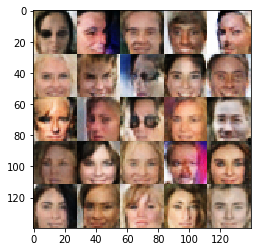

Epoch 3/5... Discriminator Loss: 0.9783... Generator Loss: 1.0473
Epoch 3/5... Discriminator Loss: 0.8021... Generator Loss: 1.0811
Epoch 3/5... Discriminator Loss: 1.1728... Generator Loss: 0.5783
Epoch 3/5... Discriminator Loss: 1.3661... Generator Loss: 0.4277
Epoch 3/5... Discriminator Loss: 1.5468... Generator Loss: 0.3356
Epoch 3/5... Discriminator Loss: 1.1409... Generator Loss: 0.5628
Epoch 3/5... Discriminator Loss: 1.0257... Generator Loss: 0.6827
Epoch 3/5... Discriminator Loss: 1.3326... Generator Loss: 0.4769
Epoch 3/5... Discriminator Loss: 0.6809... Generator Loss: 1.4091
Epoch 3/5... Discriminator Loss: 0.9837... Generator Loss: 0.7733


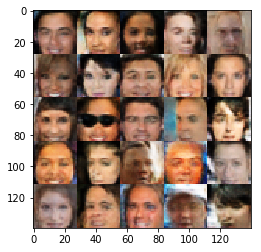

Epoch 3/5... Discriminator Loss: 1.5114... Generator Loss: 0.3662
Epoch 3/5... Discriminator Loss: 1.4037... Generator Loss: 1.4144
Epoch 3/5... Discriminator Loss: 0.9397... Generator Loss: 0.8141
Epoch 3/5... Discriminator Loss: 0.8969... Generator Loss: 1.1473
Epoch 3/5... Discriminator Loss: 0.9294... Generator Loss: 1.1617
Epoch 3/5... Discriminator Loss: 0.9933... Generator Loss: 0.8071
Epoch 3/5... Discriminator Loss: 1.0055... Generator Loss: 1.9379
Epoch 3/5... Discriminator Loss: 1.0334... Generator Loss: 1.4542
Epoch 3/5... Discriminator Loss: 0.8019... Generator Loss: 1.1442
Epoch 3/5... Discriminator Loss: 1.1238... Generator Loss: 0.5989


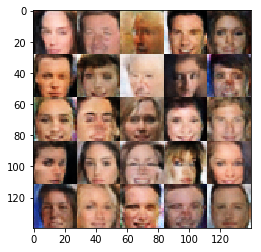

Epoch 3/5... Discriminator Loss: 0.9662... Generator Loss: 0.9112
Epoch 3/5... Discriminator Loss: 0.8497... Generator Loss: 0.8573
Epoch 3/5... Discriminator Loss: 0.8856... Generator Loss: 1.5744
Epoch 3/5... Discriminator Loss: 1.0871... Generator Loss: 0.7624
Epoch 3/5... Discriminator Loss: 1.0187... Generator Loss: 0.7012
Epoch 3/5... Discriminator Loss: 1.0146... Generator Loss: 0.7611
Epoch 3/5... Discriminator Loss: 0.8690... Generator Loss: 0.8819
Epoch 3/5... Discriminator Loss: 1.2540... Generator Loss: 0.8695
Epoch 3/5... Discriminator Loss: 1.1402... Generator Loss: 0.5626
Epoch 3/5... Discriminator Loss: 1.1982... Generator Loss: 0.5366


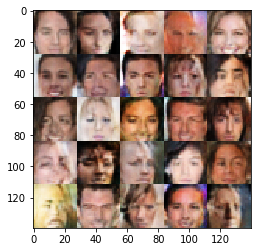

Epoch 3/5... Discriminator Loss: 1.0142... Generator Loss: 0.8037
Epoch 3/5... Discriminator Loss: 1.3626... Generator Loss: 0.3981
Epoch 3/5... Discriminator Loss: 1.6023... Generator Loss: 0.2944
Epoch 3/5... Discriminator Loss: 0.9750... Generator Loss: 0.7528
Epoch 3/5... Discriminator Loss: 0.9208... Generator Loss: 0.8363
Epoch 3/5... Discriminator Loss: 1.1105... Generator Loss: 0.7321
Epoch 3/5... Discriminator Loss: 1.0535... Generator Loss: 0.7448
Epoch 3/5... Discriminator Loss: 1.0665... Generator Loss: 0.7155
Epoch 3/5... Discriminator Loss: 1.2745... Generator Loss: 0.4610
Epoch 3/5... Discriminator Loss: 1.1088... Generator Loss: 0.8672


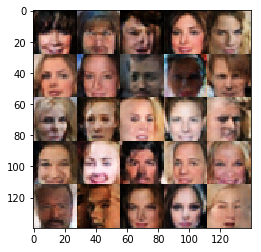

Epoch 3/5... Discriminator Loss: 1.2697... Generator Loss: 0.5684
Epoch 3/5... Discriminator Loss: 0.9433... Generator Loss: 0.9973
Epoch 3/5... Discriminator Loss: 0.7930... Generator Loss: 1.0008
Epoch 3/5... Discriminator Loss: 1.1981... Generator Loss: 1.4747
Epoch 3/5... Discriminator Loss: 1.0139... Generator Loss: 0.9226
Epoch 3/5... Discriminator Loss: 0.9079... Generator Loss: 1.1479
Epoch 3/5... Discriminator Loss: 0.9525... Generator Loss: 1.4918
Epoch 3/5... Discriminator Loss: 0.7576... Generator Loss: 1.2964
Epoch 3/5... Discriminator Loss: 0.9851... Generator Loss: 1.1180
Epoch 3/5... Discriminator Loss: 0.9179... Generator Loss: 0.9239


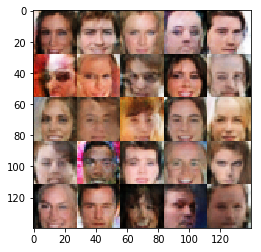

Epoch 3/5... Discriminator Loss: 1.2082... Generator Loss: 0.5304
Epoch 3/5... Discriminator Loss: 0.8530... Generator Loss: 0.9466
Epoch 3/5... Discriminator Loss: 1.2611... Generator Loss: 0.4785
Epoch 3/5... Discriminator Loss: 1.2904... Generator Loss: 0.4479
Epoch 3/5... Discriminator Loss: 0.9279... Generator Loss: 0.9463
Epoch 3/5... Discriminator Loss: 0.8895... Generator Loss: 1.1145
Epoch 3/5... Discriminator Loss: 0.8573... Generator Loss: 1.1775
Epoch 3/5... Discriminator Loss: 1.1628... Generator Loss: 0.5991
Epoch 3/5... Discriminator Loss: 0.9612... Generator Loss: 0.7471
Epoch 4/5... Discriminator Loss: 0.9406... Generator Loss: 0.7753


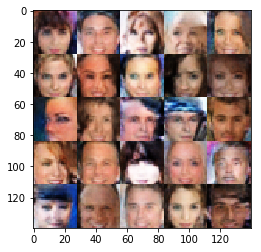

Epoch 4/5... Discriminator Loss: 0.9745... Generator Loss: 0.7386
Epoch 4/5... Discriminator Loss: 0.8471... Generator Loss: 0.9224
Epoch 4/5... Discriminator Loss: 1.0837... Generator Loss: 1.2089
Epoch 4/5... Discriminator Loss: 1.1300... Generator Loss: 0.6450
Epoch 4/5... Discriminator Loss: 1.1249... Generator Loss: 0.6868
Epoch 4/5... Discriminator Loss: 1.0482... Generator Loss: 0.6468
Epoch 4/5... Discriminator Loss: 0.7632... Generator Loss: 1.6624
Epoch 4/5... Discriminator Loss: 1.2231... Generator Loss: 1.1262
Epoch 4/5... Discriminator Loss: 1.3170... Generator Loss: 0.4802
Epoch 4/5... Discriminator Loss: 1.0004... Generator Loss: 0.8838


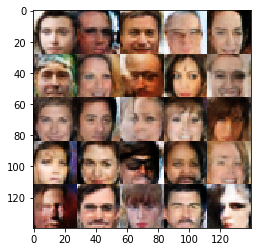

Epoch 4/5... Discriminator Loss: 0.7849... Generator Loss: 1.1399
Epoch 4/5... Discriminator Loss: 0.7956... Generator Loss: 1.2776
Epoch 4/5... Discriminator Loss: 1.0739... Generator Loss: 0.7479
Epoch 4/5... Discriminator Loss: 1.1974... Generator Loss: 0.4718
Epoch 4/5... Discriminator Loss: 0.9235... Generator Loss: 1.2248
Epoch 4/5... Discriminator Loss: 0.7675... Generator Loss: 1.1798
Epoch 4/5... Discriminator Loss: 0.9030... Generator Loss: 1.0353
Epoch 4/5... Discriminator Loss: 0.9476... Generator Loss: 1.1278
Epoch 4/5... Discriminator Loss: 1.0781... Generator Loss: 0.7412
Epoch 4/5... Discriminator Loss: 1.1869... Generator Loss: 0.5278


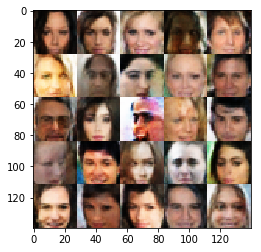

Epoch 4/5... Discriminator Loss: 0.9335... Generator Loss: 0.7784
Epoch 4/5... Discriminator Loss: 1.0168... Generator Loss: 0.7477
Epoch 4/5... Discriminator Loss: 0.9670... Generator Loss: 1.0494
Epoch 4/5... Discriminator Loss: 1.2387... Generator Loss: 0.6647
Epoch 4/5... Discriminator Loss: 1.1433... Generator Loss: 1.3188
Epoch 4/5... Discriminator Loss: 0.8327... Generator Loss: 1.2568
Epoch 4/5... Discriminator Loss: 0.7473... Generator Loss: 1.1128
Epoch 4/5... Discriminator Loss: 1.1819... Generator Loss: 0.6219
Epoch 4/5... Discriminator Loss: 0.9039... Generator Loss: 1.4192
Epoch 4/5... Discriminator Loss: 1.0945... Generator Loss: 0.8829


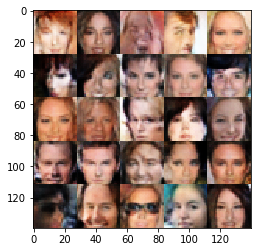

Epoch 4/5... Discriminator Loss: 1.0444... Generator Loss: 0.7211
Epoch 4/5... Discriminator Loss: 1.2229... Generator Loss: 1.4097
Epoch 4/5... Discriminator Loss: 1.3314... Generator Loss: 0.3878
Epoch 4/5... Discriminator Loss: 1.1858... Generator Loss: 0.6438
Epoch 4/5... Discriminator Loss: 1.0836... Generator Loss: 0.6382
Epoch 4/5... Discriminator Loss: 1.1636... Generator Loss: 0.5748
Epoch 4/5... Discriminator Loss: 1.0362... Generator Loss: 0.5617
Epoch 4/5... Discriminator Loss: 1.1171... Generator Loss: 0.6551
Epoch 4/5... Discriminator Loss: 1.0378... Generator Loss: 0.6565
Epoch 4/5... Discriminator Loss: 0.9114... Generator Loss: 0.8608


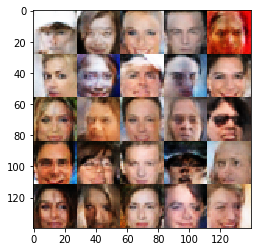

Epoch 4/5... Discriminator Loss: 0.9130... Generator Loss: 1.6719
Epoch 4/5... Discriminator Loss: 1.4194... Generator Loss: 0.4010
Epoch 4/5... Discriminator Loss: 1.0553... Generator Loss: 0.6065
Epoch 4/5... Discriminator Loss: 0.9445... Generator Loss: 1.1978
Epoch 4/5... Discriminator Loss: 0.8266... Generator Loss: 1.1209
Epoch 4/5... Discriminator Loss: 1.1122... Generator Loss: 1.1127
Epoch 4/5... Discriminator Loss: 1.1405... Generator Loss: 0.8053
Epoch 4/5... Discriminator Loss: 1.2052... Generator Loss: 0.8550
Epoch 4/5... Discriminator Loss: 0.9778... Generator Loss: 0.8622
Epoch 4/5... Discriminator Loss: 1.3393... Generator Loss: 0.4691


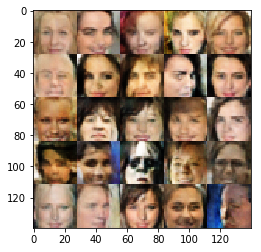

Epoch 4/5... Discriminator Loss: 1.1329... Generator Loss: 0.6120
Epoch 4/5... Discriminator Loss: 0.9225... Generator Loss: 0.8761
Epoch 4/5... Discriminator Loss: 1.0542... Generator Loss: 0.6909
Epoch 4/5... Discriminator Loss: 0.9659... Generator Loss: 0.9606
Epoch 4/5... Discriminator Loss: 1.2397... Generator Loss: 0.5601
Epoch 4/5... Discriminator Loss: 1.2017... Generator Loss: 0.5784
Epoch 4/5... Discriminator Loss: 1.2272... Generator Loss: 0.4980
Epoch 4/5... Discriminator Loss: 1.1386... Generator Loss: 0.5387
Epoch 4/5... Discriminator Loss: 0.9080... Generator Loss: 0.8574
Epoch 4/5... Discriminator Loss: 0.7882... Generator Loss: 1.1227


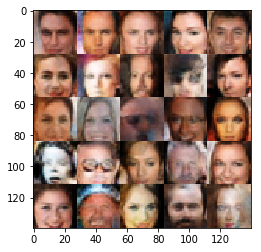

Epoch 4/5... Discriminator Loss: 1.1949... Generator Loss: 0.6329
Epoch 4/5... Discriminator Loss: 1.2201... Generator Loss: 0.6133
Epoch 4/5... Discriminator Loss: 0.6607... Generator Loss: 1.2189
Epoch 4/5... Discriminator Loss: 0.9902... Generator Loss: 0.8484
Epoch 4/5... Discriminator Loss: 0.9896... Generator Loss: 0.7265
Epoch 4/5... Discriminator Loss: 1.0022... Generator Loss: 0.6758
Epoch 4/5... Discriminator Loss: 0.8096... Generator Loss: 0.9306
Epoch 4/5... Discriminator Loss: 1.0878... Generator Loss: 0.6060
Epoch 4/5... Discriminator Loss: 0.9870... Generator Loss: 0.7169
Epoch 4/5... Discriminator Loss: 0.8515... Generator Loss: 0.9216


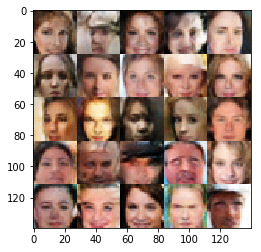

Epoch 4/5... Discriminator Loss: 1.1865... Generator Loss: 0.8200
Epoch 4/5... Discriminator Loss: 0.8423... Generator Loss: 0.9210
Epoch 4/5... Discriminator Loss: 1.1231... Generator Loss: 0.9108
Epoch 4/5... Discriminator Loss: 1.0915... Generator Loss: 0.5941
Epoch 4/5... Discriminator Loss: 1.0030... Generator Loss: 0.7238
Epoch 4/5... Discriminator Loss: 0.9570... Generator Loss: 1.0754
Epoch 4/5... Discriminator Loss: 0.8933... Generator Loss: 1.0904
Epoch 4/5... Discriminator Loss: 0.9208... Generator Loss: 1.1758
Epoch 4/5... Discriminator Loss: 1.3122... Generator Loss: 0.4306
Epoch 4/5... Discriminator Loss: 1.0693... Generator Loss: 0.8589


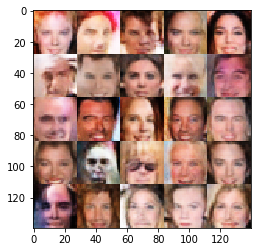

Epoch 4/5... Discriminator Loss: 1.2865... Generator Loss: 0.5270
Epoch 4/5... Discriminator Loss: 0.8507... Generator Loss: 1.0469
Epoch 4/5... Discriminator Loss: 0.9441... Generator Loss: 0.7624
Epoch 4/5... Discriminator Loss: 1.1163... Generator Loss: 0.6184
Epoch 4/5... Discriminator Loss: 1.2285... Generator Loss: 0.5026
Epoch 4/5... Discriminator Loss: 1.0185... Generator Loss: 1.3893
Epoch 4/5... Discriminator Loss: 1.1976... Generator Loss: 0.5272
Epoch 4/5... Discriminator Loss: 0.8568... Generator Loss: 0.9912
Epoch 4/5... Discriminator Loss: 1.1330... Generator Loss: 0.9575
Epoch 4/5... Discriminator Loss: 0.7331... Generator Loss: 1.1614


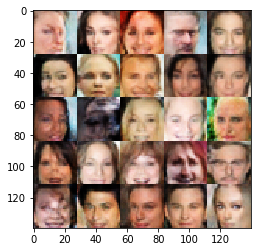

Epoch 4/5... Discriminator Loss: 0.7610... Generator Loss: 1.0911
Epoch 4/5... Discriminator Loss: 0.6993... Generator Loss: 1.2582
Epoch 4/5... Discriminator Loss: 0.9902... Generator Loss: 0.6779
Epoch 4/5... Discriminator Loss: 1.0156... Generator Loss: 0.8930
Epoch 4/5... Discriminator Loss: 1.3292... Generator Loss: 0.4682
Epoch 4/5... Discriminator Loss: 0.8824... Generator Loss: 1.7616
Epoch 4/5... Discriminator Loss: 1.0500... Generator Loss: 0.7332
Epoch 4/5... Discriminator Loss: 1.3710... Generator Loss: 0.4205
Epoch 4/5... Discriminator Loss: 1.2713... Generator Loss: 0.4828
Epoch 4/5... Discriminator Loss: 1.1122... Generator Loss: 0.5555


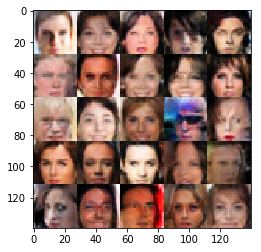

Epoch 4/5... Discriminator Loss: 1.1563... Generator Loss: 0.5445
Epoch 4/5... Discriminator Loss: 1.1031... Generator Loss: 0.7504
Epoch 4/5... Discriminator Loss: 1.2531... Generator Loss: 0.4957
Epoch 4/5... Discriminator Loss: 0.8101... Generator Loss: 1.1717
Epoch 4/5... Discriminator Loss: 1.3408... Generator Loss: 0.4289
Epoch 4/5... Discriminator Loss: 0.9356... Generator Loss: 0.7502
Epoch 4/5... Discriminator Loss: 1.3441... Generator Loss: 0.4284
Epoch 4/5... Discriminator Loss: 0.8084... Generator Loss: 1.3296
Epoch 4/5... Discriminator Loss: 1.0639... Generator Loss: 0.6752
Epoch 4/5... Discriminator Loss: 1.1977... Generator Loss: 0.4787


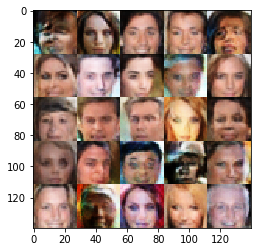

Epoch 4/5... Discriminator Loss: 0.8318... Generator Loss: 0.9349
Epoch 4/5... Discriminator Loss: 0.7540... Generator Loss: 0.9821
Epoch 4/5... Discriminator Loss: 1.4405... Generator Loss: 0.4175
Epoch 4/5... Discriminator Loss: 0.8064... Generator Loss: 1.1554
Epoch 4/5... Discriminator Loss: 0.7273... Generator Loss: 1.3265
Epoch 4/5... Discriminator Loss: 0.9665... Generator Loss: 0.9621
Epoch 4/5... Discriminator Loss: 1.3895... Generator Loss: 0.6408
Epoch 4/5... Discriminator Loss: 1.2451... Generator Loss: 0.4797
Epoch 4/5... Discriminator Loss: 1.2280... Generator Loss: 0.6992
Epoch 4/5... Discriminator Loss: 1.0369... Generator Loss: 0.6121


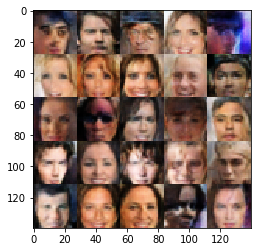

Epoch 4/5... Discriminator Loss: 0.9749... Generator Loss: 0.7554
Epoch 4/5... Discriminator Loss: 1.0051... Generator Loss: 0.6918
Epoch 4/5... Discriminator Loss: 1.0450... Generator Loss: 1.8415
Epoch 4/5... Discriminator Loss: 0.9190... Generator Loss: 0.8634
Epoch 4/5... Discriminator Loss: 0.8771... Generator Loss: 1.1309
Epoch 4/5... Discriminator Loss: 1.1263... Generator Loss: 0.6370
Epoch 4/5... Discriminator Loss: 0.8912... Generator Loss: 1.0102
Epoch 4/5... Discriminator Loss: 0.8758... Generator Loss: 0.9275
Epoch 4/5... Discriminator Loss: 1.0853... Generator Loss: 0.6164
Epoch 4/5... Discriminator Loss: 0.9584... Generator Loss: 1.0133


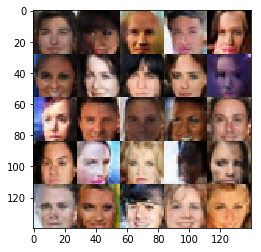

Epoch 4/5... Discriminator Loss: 1.2448... Generator Loss: 0.4663
Epoch 4/5... Discriminator Loss: 0.8393... Generator Loss: 1.0744
Epoch 4/5... Discriminator Loss: 1.1790... Generator Loss: 0.9576
Epoch 4/5... Discriminator Loss: 0.9897... Generator Loss: 0.8529
Epoch 4/5... Discriminator Loss: 1.0119... Generator Loss: 0.6782
Epoch 4/5... Discriminator Loss: 0.8260... Generator Loss: 1.5113
Epoch 4/5... Discriminator Loss: 0.7689... Generator Loss: 1.1332
Epoch 4/5... Discriminator Loss: 0.9556... Generator Loss: 0.9574
Epoch 4/5... Discriminator Loss: 1.0043... Generator Loss: 0.7985
Epoch 4/5... Discriminator Loss: 1.0109... Generator Loss: 0.8747


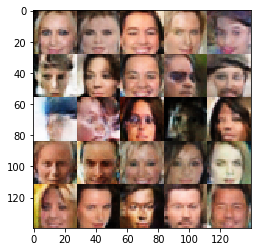

Epoch 4/5... Discriminator Loss: 1.5204... Generator Loss: 0.3307
Epoch 4/5... Discriminator Loss: 1.0119... Generator Loss: 0.7612
Epoch 4/5... Discriminator Loss: 0.9259... Generator Loss: 1.0961
Epoch 4/5... Discriminator Loss: 0.8915... Generator Loss: 0.7938
Epoch 4/5... Discriminator Loss: 0.7459... Generator Loss: 1.1582
Epoch 4/5... Discriminator Loss: 1.2514... Generator Loss: 0.4831
Epoch 4/5... Discriminator Loss: 1.0044... Generator Loss: 1.3842
Epoch 4/5... Discriminator Loss: 1.0280... Generator Loss: 0.7419
Epoch 4/5... Discriminator Loss: 0.9747... Generator Loss: 0.7725
Epoch 4/5... Discriminator Loss: 1.2033... Generator Loss: 1.1904


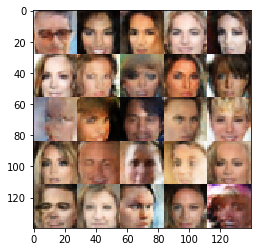

Epoch 4/5... Discriminator Loss: 0.6453... Generator Loss: 1.2610
Epoch 4/5... Discriminator Loss: 1.1616... Generator Loss: 0.5159
Epoch 4/5... Discriminator Loss: 1.2093... Generator Loss: 0.5459
Epoch 4/5... Discriminator Loss: 0.8343... Generator Loss: 0.9148
Epoch 4/5... Discriminator Loss: 1.1042... Generator Loss: 0.5484
Epoch 4/5... Discriminator Loss: 1.0574... Generator Loss: 0.9416
Epoch 4/5... Discriminator Loss: 0.6056... Generator Loss: 1.4363
Epoch 4/5... Discriminator Loss: 0.8915... Generator Loss: 1.1041
Epoch 4/5... Discriminator Loss: 0.7394... Generator Loss: 1.3897
Epoch 4/5... Discriminator Loss: 0.8212... Generator Loss: 0.8820


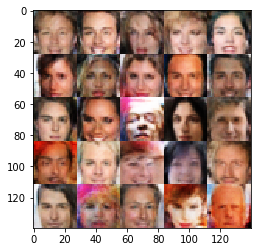

Epoch 4/5... Discriminator Loss: 1.0969... Generator Loss: 2.0298
Epoch 4/5... Discriminator Loss: 0.8763... Generator Loss: 0.8823
Epoch 4/5... Discriminator Loss: 0.9923... Generator Loss: 0.7575
Epoch 4/5... Discriminator Loss: 1.0733... Generator Loss: 0.7008
Epoch 4/5... Discriminator Loss: 1.0587... Generator Loss: 0.6687
Epoch 4/5... Discriminator Loss: 1.2190... Generator Loss: 0.6481
Epoch 4/5... Discriminator Loss: 0.9451... Generator Loss: 0.8160
Epoch 4/5... Discriminator Loss: 1.3888... Generator Loss: 0.3989
Epoch 4/5... Discriminator Loss: 0.9996... Generator Loss: 0.8831
Epoch 4/5... Discriminator Loss: 0.6856... Generator Loss: 1.0450


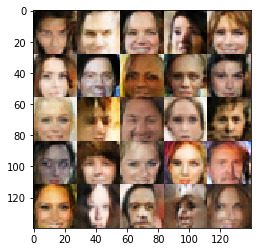

Epoch 4/5... Discriminator Loss: 1.0606... Generator Loss: 0.7057
Epoch 4/5... Discriminator Loss: 1.0125... Generator Loss: 0.7156
Epoch 4/5... Discriminator Loss: 1.0908... Generator Loss: 0.6835
Epoch 4/5... Discriminator Loss: 0.9708... Generator Loss: 0.7722
Epoch 4/5... Discriminator Loss: 0.6277... Generator Loss: 1.3737
Epoch 4/5... Discriminator Loss: 1.4680... Generator Loss: 0.3557
Epoch 4/5... Discriminator Loss: 1.0134... Generator Loss: 1.2281
Epoch 4/5... Discriminator Loss: 0.8842... Generator Loss: 0.9401
Epoch 4/5... Discriminator Loss: 0.8482... Generator Loss: 1.3296
Epoch 4/5... Discriminator Loss: 1.2119... Generator Loss: 0.6478


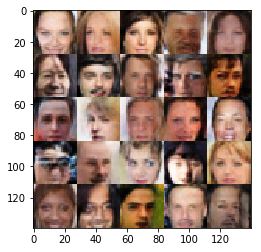

Epoch 4/5... Discriminator Loss: 0.8271... Generator Loss: 1.0665
Epoch 4/5... Discriminator Loss: 0.9233... Generator Loss: 1.0905
Epoch 4/5... Discriminator Loss: 0.9206... Generator Loss: 1.6762
Epoch 4/5... Discriminator Loss: 0.9669... Generator Loss: 0.8797
Epoch 4/5... Discriminator Loss: 1.0355... Generator Loss: 0.6667
Epoch 4/5... Discriminator Loss: 1.0647... Generator Loss: 0.8640
Epoch 4/5... Discriminator Loss: 0.7604... Generator Loss: 1.2469
Epoch 4/5... Discriminator Loss: 0.8074... Generator Loss: 1.0027
Epoch 4/5... Discriminator Loss: 1.1044... Generator Loss: 1.5569
Epoch 4/5... Discriminator Loss: 1.1150... Generator Loss: 0.6999


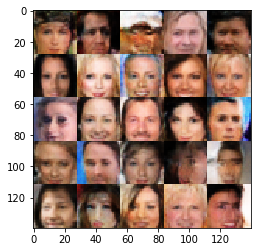

Epoch 4/5... Discriminator Loss: 0.8392... Generator Loss: 1.3087
Epoch 4/5... Discriminator Loss: 1.0260... Generator Loss: 0.7567
Epoch 4/5... Discriminator Loss: 0.8469... Generator Loss: 1.4743
Epoch 4/5... Discriminator Loss: 1.2364... Generator Loss: 0.5998
Epoch 4/5... Discriminator Loss: 0.9958... Generator Loss: 0.7280
Epoch 4/5... Discriminator Loss: 1.1184... Generator Loss: 0.6539
Epoch 4/5... Discriminator Loss: 1.5384... Generator Loss: 0.3562
Epoch 4/5... Discriminator Loss: 0.8232... Generator Loss: 1.1624
Epoch 4/5... Discriminator Loss: 0.9109... Generator Loss: 0.8181
Epoch 4/5... Discriminator Loss: 1.1524... Generator Loss: 0.5904


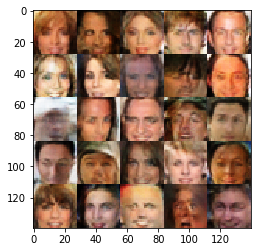

Epoch 4/5... Discriminator Loss: 0.9475... Generator Loss: 0.8635
Epoch 4/5... Discriminator Loss: 1.2207... Generator Loss: 0.6761
Epoch 4/5... Discriminator Loss: 1.1345... Generator Loss: 0.5936
Epoch 4/5... Discriminator Loss: 1.0856... Generator Loss: 0.9259
Epoch 4/5... Discriminator Loss: 1.2075... Generator Loss: 0.5557
Epoch 4/5... Discriminator Loss: 1.4278... Generator Loss: 0.3952
Epoch 4/5... Discriminator Loss: 1.2405... Generator Loss: 0.5044
Epoch 4/5... Discriminator Loss: 0.9295... Generator Loss: 0.8740
Epoch 4/5... Discriminator Loss: 0.7755... Generator Loss: 1.1337
Epoch 4/5... Discriminator Loss: 1.2901... Generator Loss: 0.5073


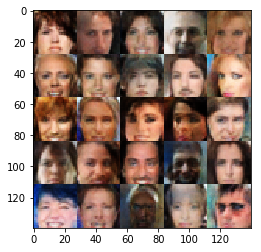

Epoch 4/5... Discriminator Loss: 0.8005... Generator Loss: 1.0030
Epoch 4/5... Discriminator Loss: 1.2358... Generator Loss: 0.5293
Epoch 4/5... Discriminator Loss: 1.5773... Generator Loss: 0.3489
Epoch 4/5... Discriminator Loss: 1.2922... Generator Loss: 0.5028
Epoch 4/5... Discriminator Loss: 1.0883... Generator Loss: 0.6113
Epoch 4/5... Discriminator Loss: 0.9281... Generator Loss: 1.5460
Epoch 4/5... Discriminator Loss: 1.2523... Generator Loss: 0.5009
Epoch 4/5... Discriminator Loss: 0.9217... Generator Loss: 0.9993
Epoch 4/5... Discriminator Loss: 1.0719... Generator Loss: 0.7936
Epoch 4/5... Discriminator Loss: 1.0938... Generator Loss: 0.6164


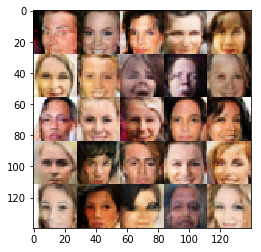

Epoch 4/5... Discriminator Loss: 1.4412... Generator Loss: 0.3732
Epoch 4/5... Discriminator Loss: 1.1456... Generator Loss: 0.8319
Epoch 4/5... Discriminator Loss: 1.4647... Generator Loss: 0.3499
Epoch 4/5... Discriminator Loss: 0.9243... Generator Loss: 0.9975
Epoch 4/5... Discriminator Loss: 0.8215... Generator Loss: 1.0696
Epoch 4/5... Discriminator Loss: 1.3133... Generator Loss: 0.4870
Epoch 4/5... Discriminator Loss: 1.0616... Generator Loss: 0.7381
Epoch 4/5... Discriminator Loss: 0.8783... Generator Loss: 1.0724
Epoch 4/5... Discriminator Loss: 1.1107... Generator Loss: 0.6007
Epoch 4/5... Discriminator Loss: 0.9812... Generator Loss: 0.7144


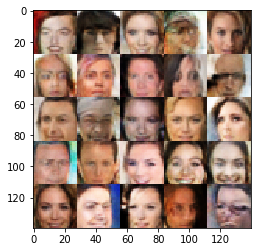

Epoch 4/5... Discriminator Loss: 1.0816... Generator Loss: 0.6161
Epoch 4/5... Discriminator Loss: 0.7531... Generator Loss: 1.3385
Epoch 4/5... Discriminator Loss: 0.6976... Generator Loss: 1.0133
Epoch 4/5... Discriminator Loss: 1.0211... Generator Loss: 0.8518
Epoch 4/5... Discriminator Loss: 0.8332... Generator Loss: 1.0149
Epoch 4/5... Discriminator Loss: 1.1735... Generator Loss: 1.1933
Epoch 4/5... Discriminator Loss: 1.4225... Generator Loss: 0.3680
Epoch 4/5... Discriminator Loss: 0.9678... Generator Loss: 1.0131
Epoch 4/5... Discriminator Loss: 0.9646... Generator Loss: 0.8248
Epoch 4/5... Discriminator Loss: 1.0062... Generator Loss: 1.3057


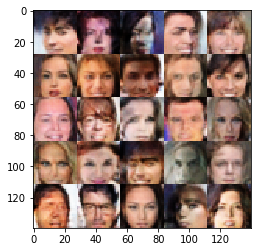

Epoch 4/5... Discriminator Loss: 1.1496... Generator Loss: 0.5014
Epoch 4/5... Discriminator Loss: 1.1701... Generator Loss: 0.7108
Epoch 4/5... Discriminator Loss: 1.0032... Generator Loss: 1.1630
Epoch 4/5... Discriminator Loss: 0.7230... Generator Loss: 1.0295
Epoch 4/5... Discriminator Loss: 1.2428... Generator Loss: 0.6695
Epoch 4/5... Discriminator Loss: 0.9817... Generator Loss: 1.1906
Epoch 4/5... Discriminator Loss: 1.1321... Generator Loss: 0.5673
Epoch 4/5... Discriminator Loss: 0.9959... Generator Loss: 0.6790
Epoch 4/5... Discriminator Loss: 1.2297... Generator Loss: 0.5427
Epoch 4/5... Discriminator Loss: 0.8998... Generator Loss: 0.9555


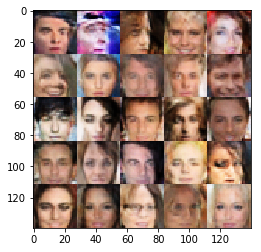

Epoch 4/5... Discriminator Loss: 0.7450... Generator Loss: 1.0149
Epoch 4/5... Discriminator Loss: 1.0677... Generator Loss: 0.6479
Epoch 4/5... Discriminator Loss: 0.9608... Generator Loss: 0.7429
Epoch 4/5... Discriminator Loss: 1.0166... Generator Loss: 1.0443
Epoch 4/5... Discriminator Loss: 1.1406... Generator Loss: 0.5337
Epoch 4/5... Discriminator Loss: 1.2223... Generator Loss: 0.4956
Epoch 4/5... Discriminator Loss: 1.0316... Generator Loss: 0.6372
Epoch 4/5... Discriminator Loss: 1.1213... Generator Loss: 1.5577
Epoch 4/5... Discriminator Loss: 1.0978... Generator Loss: 0.6753
Epoch 4/5... Discriminator Loss: 0.8499... Generator Loss: 0.8743


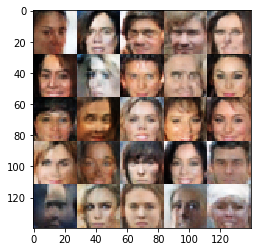

Epoch 4/5... Discriminator Loss: 0.8712... Generator Loss: 1.5922
Epoch 4/5... Discriminator Loss: 1.0909... Generator Loss: 0.6896
Epoch 4/5... Discriminator Loss: 0.8192... Generator Loss: 0.9175
Epoch 4/5... Discriminator Loss: 1.0615... Generator Loss: 0.7320
Epoch 4/5... Discriminator Loss: 0.7088... Generator Loss: 1.6932
Epoch 4/5... Discriminator Loss: 0.9403... Generator Loss: 0.7850
Epoch 4/5... Discriminator Loss: 1.2219... Generator Loss: 0.5295
Epoch 4/5... Discriminator Loss: 0.9163... Generator Loss: 0.8535
Epoch 4/5... Discriminator Loss: 0.7627... Generator Loss: 1.4290
Epoch 4/5... Discriminator Loss: 1.0897... Generator Loss: 0.6373


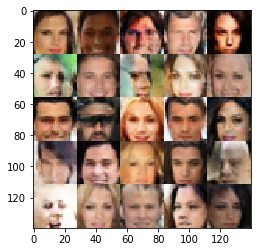

Epoch 4/5... Discriminator Loss: 0.9151... Generator Loss: 0.7767
Epoch 4/5... Discriminator Loss: 1.0761... Generator Loss: 0.8362
Epoch 4/5... Discriminator Loss: 0.9797... Generator Loss: 0.7759
Epoch 4/5... Discriminator Loss: 0.8944... Generator Loss: 1.4189
Epoch 4/5... Discriminator Loss: 1.1964... Generator Loss: 0.5795
Epoch 4/5... Discriminator Loss: 0.9072... Generator Loss: 0.8485
Epoch 4/5... Discriminator Loss: 1.0374... Generator Loss: 0.7416
Epoch 4/5... Discriminator Loss: 0.7875... Generator Loss: 0.9670
Epoch 4/5... Discriminator Loss: 0.8641... Generator Loss: 2.0895
Epoch 4/5... Discriminator Loss: 1.0477... Generator Loss: 0.9036


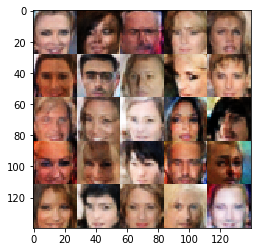

Epoch 4/5... Discriminator Loss: 0.9392... Generator Loss: 0.9631
Epoch 4/5... Discriminator Loss: 1.2035... Generator Loss: 0.6558
Epoch 4/5... Discriminator Loss: 0.9786... Generator Loss: 1.0930
Epoch 4/5... Discriminator Loss: 0.9802... Generator Loss: 0.8634
Epoch 4/5... Discriminator Loss: 0.9823... Generator Loss: 0.7274
Epoch 4/5... Discriminator Loss: 0.9414... Generator Loss: 0.9831
Epoch 4/5... Discriminator Loss: 0.9760... Generator Loss: 0.7523
Epoch 4/5... Discriminator Loss: 0.9351... Generator Loss: 0.8527
Epoch 4/5... Discriminator Loss: 0.7532... Generator Loss: 1.1014
Epoch 4/5... Discriminator Loss: 1.0811... Generator Loss: 1.1718


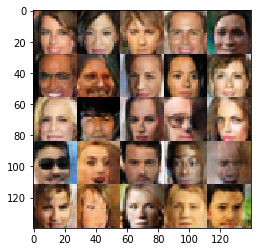

Epoch 4/5... Discriminator Loss: 0.9964... Generator Loss: 0.7050
Epoch 4/5... Discriminator Loss: 0.6763... Generator Loss: 1.9307
Epoch 4/5... Discriminator Loss: 1.1394... Generator Loss: 0.9224
Epoch 4/5... Discriminator Loss: 0.8646... Generator Loss: 0.9558
Epoch 4/5... Discriminator Loss: 0.9282... Generator Loss: 0.8450
Epoch 4/5... Discriminator Loss: 1.2476... Generator Loss: 0.7046
Epoch 4/5... Discriminator Loss: 1.2434... Generator Loss: 0.5453
Epoch 4/5... Discriminator Loss: 1.1442... Generator Loss: 0.8330
Epoch 4/5... Discriminator Loss: 1.2835... Generator Loss: 0.4325
Epoch 4/5... Discriminator Loss: 1.0091... Generator Loss: 1.1379


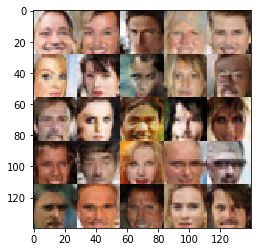

Epoch 4/5... Discriminator Loss: 1.1109... Generator Loss: 0.9982
Epoch 4/5... Discriminator Loss: 1.4731... Generator Loss: 0.3585
Epoch 4/5... Discriminator Loss: 0.7704... Generator Loss: 1.1601
Epoch 4/5... Discriminator Loss: 0.9162... Generator Loss: 1.0936
Epoch 4/5... Discriminator Loss: 0.9745... Generator Loss: 1.1114
Epoch 4/5... Discriminator Loss: 0.9487... Generator Loss: 1.3738
Epoch 4/5... Discriminator Loss: 0.9267... Generator Loss: 0.7959
Epoch 4/5... Discriminator Loss: 0.9302... Generator Loss: 0.6865
Epoch 4/5... Discriminator Loss: 0.8750... Generator Loss: 0.7944
Epoch 4/5... Discriminator Loss: 0.7594... Generator Loss: 1.0787


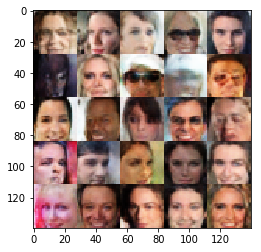

Epoch 4/5... Discriminator Loss: 1.0625... Generator Loss: 0.6257
Epoch 4/5... Discriminator Loss: 1.4604... Generator Loss: 0.3997
Epoch 4/5... Discriminator Loss: 0.9253... Generator Loss: 0.7383
Epoch 4/5... Discriminator Loss: 0.8041... Generator Loss: 1.2153
Epoch 4/5... Discriminator Loss: 1.4404... Generator Loss: 0.3591
Epoch 4/5... Discriminator Loss: 0.8802... Generator Loss: 0.8868
Epoch 5/5... Discriminator Loss: 0.8323... Generator Loss: 1.0381
Epoch 5/5... Discriminator Loss: 1.4599... Generator Loss: 0.4184
Epoch 5/5... Discriminator Loss: 0.8211... Generator Loss: 0.9339
Epoch 5/5... Discriminator Loss: 0.9432... Generator Loss: 1.2917


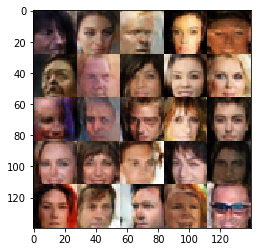

Epoch 5/5... Discriminator Loss: 1.3370... Generator Loss: 0.4020
Epoch 5/5... Discriminator Loss: 1.3701... Generator Loss: 0.4294
Epoch 5/5... Discriminator Loss: 1.1119... Generator Loss: 0.8262
Epoch 5/5... Discriminator Loss: 1.0341... Generator Loss: 0.9641
Epoch 5/5... Discriminator Loss: 0.8826... Generator Loss: 1.5660
Epoch 5/5... Discriminator Loss: 1.2894... Generator Loss: 0.6988
Epoch 5/5... Discriminator Loss: 1.0021... Generator Loss: 0.7163
Epoch 5/5... Discriminator Loss: 1.2675... Generator Loss: 0.6162
Epoch 5/5... Discriminator Loss: 1.0440... Generator Loss: 0.6629
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.4242


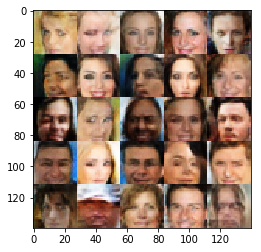

In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.